<h1>Libraries And Utilities</h1>

In [ ]:
!pip3 install tensorflow==2.8
!pip3 install lime
!pip3 install shap==0.40.0
!pip3 install numba

In [ ]:
from numba import cuda

device = cuda.get_current_device()
device.reset()

In [ ]:
import sys, os, glob, pathlib, shap, warnings, time
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from lime import lime_image
from skimage.segmentation import mark_boundaries
from skimage.io import imread, imsave
from skimage.transform import resize

from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score, matthews_corrcoef, roc_auc_score

warnings.filterwarnings(action="ignore", message="^internal gelsd")

import tensorflow as tf
from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.applications.resnet50 import preprocess_input as preprocess_input_resnet
from tensorflow.keras.applications.mobilenet_v2 import MobileNetV2
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input as preprocess_input_mobilenet
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.applications.vgg16 import preprocess_input as preprocess_input_vgg16
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.applications.inception_v3 import preprocess_input as preprocess_input_inceptionV3
from tensorflow.keras.models import Sequential
from tensorflow.keras import layers, Model, Input, utils
from tensorflow.keras.preprocessing import image_dataset_from_directory, image
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import SparseCategoricalCrossentropy, KLDivergence
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.data.experimental import cardinality

from google.colab import drive
drive.mount('/content/drive')

sys.path.insert(0,'/content/drive/MyDrive/tese_mestrado_JoseMauricio_ISEC/utils')
from gradCam import read_and_transform_img, make_gradcam_heatmap_CNN, display_gradcam
from distillation import Distiller
from occlusion_maps import OcclusionMaps
from rise import RISE

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


<h1>Load Dataset</h1>

In [ ]:
!unzip -q '/content/drive/MyDrive/tese_mestrado_JoseMauricio_ISEC/datasets/dataset_CD_UC_v3.zip'

In [ ]:
data_dir = pathlib.Path('/content/dataset_CD_UC')

# Input size initial
batch_size = 32

IMG_SIZE = (224, 224)

train_ds = image_dataset_from_directory(
  data_dir,
  validation_split=0.7,
  subset="training",
  seed=123,
  shuffle=True,
  image_size=IMG_SIZE,
  batch_size=batch_size)

val_ds = image_dataset_from_directory(
  data_dir,
  validation_split=0.3,
  subset="validation",
  seed=123,
  shuffle=True,
  image_size=IMG_SIZE,
  batch_size=batch_size)

val_batches = cardinality(val_ds)
test_ds = val_ds.take((2*val_batches) // 3)    #Take 20% for test
val_ds = val_ds.skip((2*val_batches) // 3)   #Take 10% for validation

class_names = train_ds.class_names

print(class_names)

Found 2714 files belonging to 2 classes.
Using 815 files for training.
Found 2714 files belonging to 2 classes.
Using 814 files for validation.
['crohn-disease', 'ulcerative-colitis']


Found 2714 files belonging to 2 classes.


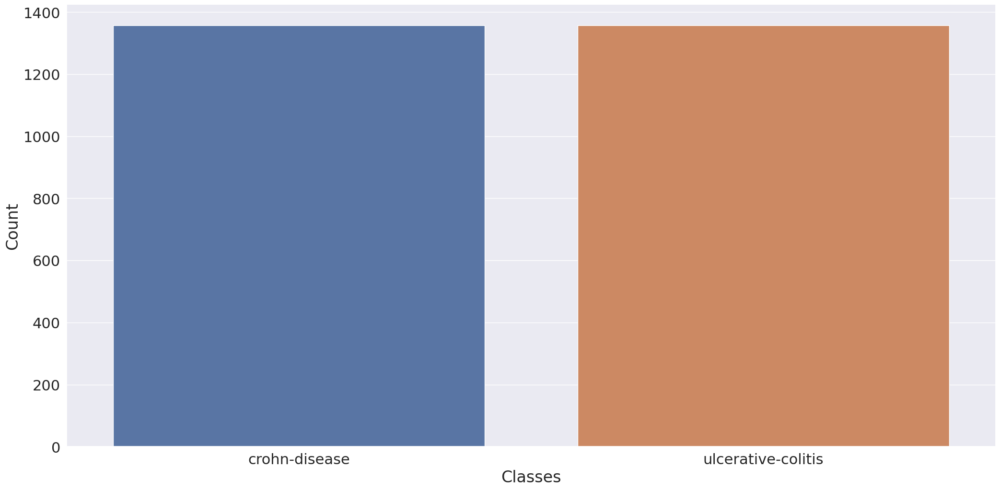

In [ ]:
def class_distribution(dataset):
    class_values = []
    total_batches = dataset.__len__().numpy()
    for batch, element in enumerate(dataset.as_numpy_iterator()):
        if batch+1 == total_batches:
            for i in range(len(element[1])):
                class_values.append(class_names[int(element[1][i])])
        else:
            for i in range(batch_size):
                class_values.append(class_names[int(element[1][i])])

    class_n, frequency = np.unique(np.array(class_values), return_counts=True)
    count = pd.DataFrame(columns=["Classes","Count"])
    count["Classes"] = class_n
    count["Count"] = frequency
    return count, class_values

dataset1 = image_dataset_from_directory(data_dir)

df_class_dist, class_df_values_val = class_distribution(dataset1)
plt.figure(figsize=(25, 12))
sns.set(font_scale=2.0)
sns.barplot(data=df_class_dist, y="Count" ,x="Classes");
plt.show()

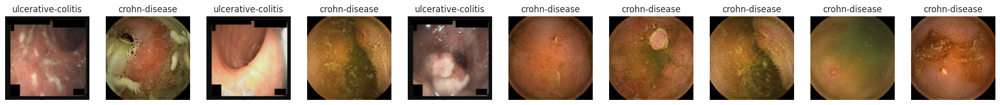

In [ ]:
plt.figure(figsize=(25, 15))
for images, labels in train_ds.take(1):
    for i in range(10):
        ax = plt.subplot(2, 10, i + 1)
        sns.set(font_scale=1.0)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(class_names[labels[i]])
        plt.axis("off")

<h1>Classificiation</h1>

In [ ]:
data_augmentation = Sequential([
  layers.RandomFlip("horizontal_and_vertical"),
  layers.RandomRotation(0.2),
  layers.RandomContrast(0.15),
  layers.RandomZoom(-.2,-.3)
])

In [ ]:
early_stopping = EarlyStopping(monitor='val_accuracy', patience=5)
sns.set(font_scale=1.0)

In [ ]:
images, labels = tuple(zip(*val_ds))

true_images = np.concatenate(images)
true_labels = np.concatenate(labels)

<h1>Student model</h1>

In [ ]:
inputs = Input(shape=IMG_SIZE + (3,))
x = data_augmentation(inputs)
x = layers.Conv2D(filters=32, kernel_size=3, activation='relu', padding = 'same')(x)
x = layers.Conv2D(filters=32, kernel_size=3, activation='relu', padding = 'same')(x)
x = layers.BatchNormalization()(x)
x = layers.MaxPooling2D()(x)
x = layers.Conv2D(filters=64, kernel_size=3, activation='relu', padding = 'same')(x)
x = layers.Conv2D(filters=64, kernel_size=3, activation='relu', padding = 'same')(x)
x = layers.BatchNormalization()(x)
x = layers.MaxPooling2D()(x)
x = layers.Conv2D(filters=128, kernel_size=3, activation='relu', padding = 'same')(x)
x = layers.Conv2D(filters=128, kernel_size=3, activation='relu', padding = 'same')(x)
x = layers.MaxPooling2D()(x)
x = layers.Conv2D(filters=256, kernel_size=3, activation='relu', padding = 'same')(x)
x = layers.Conv2D(filters=256, kernel_size=3, activation='relu', padding = 'same')(x)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dense(128, activation='relu')(x)
x = layers.Dense(128, activation='relu')(x)
x = layers.Dropout(0.5)(x)
x = layers.Dense(128, activation='relu')(x)
x = layers.Dense(64, activation='relu')(x)
x = layers.Dropout(0.5)(x)
x = layers.Dense(64, activation='relu')(x)
x = layers.Dense(48, activation='relu')(x)
outputs = layers.Dense(len(class_names))(x)
student_model = Model(inputs, outputs)

In [ ]:
student_model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 sequential (Sequential)     (None, 224, 224, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 224, 224, 32)      896       
                                                                 
 conv2d_1 (Conv2D)           (None, 224, 224, 32)      9248      
                                                                 
 batch_normalization (BatchN  (None, 224, 224, 32)     128       
 ormalization)                                                   
                                                                 
 max_pooling2d (MaxPooling2D  (None, 112, 112, 32)     0         
 )                                                           

<h1>Images to Interpretability</h1>

In [ ]:
dir = pathlib.Path('/content/test')
interpretability_data = image_dataset_from_directory(dir, image_size=IMG_SIZE, batch_size=batch_size)
print(interpretability_data.class_names)

images_exp, labels_exp = tuple(zip(*interpretability_data))

image_interpretability_3 = np.concatenate(images_exp)
labels_interpretability_3 = np.concatenate(labels_exp)

Found 6 files belonging to 2 classes.
['crohn-disease', 'ulcerative-colitis']


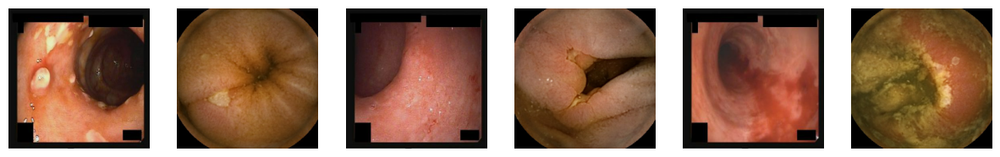

In [ ]:
fig, axis = plt.subplots(1, 6, figsize=(15, 15))
for _images, ax in zip(image_interpretability_3, axis.flat):
  img_array = read_and_transform_img(_images)
    
  ax.imshow(img_array[0].astype(np.uint8))
  ax.axis('off')

In [ ]:
print('*** Ground truth ***\n')
for val in labels_interpretability_3:
  if val == 0: print('crohn-disease')
  else: print('ulcerative-colitis')

*** Ground truth ***

ulcerative-colitis
crohn-disease
ulcerative-colitis
crohn-disease
ulcerative-colitis
crohn-disease


# AlexNet

In [ ]:
model_alexnet = Sequential([
    data_augmentation,
    layers.Conv2D(filters=96, kernel_size=(11,11), strides=(4,4), activation='relu', input_shape=(224,224,3)),
    layers.BatchNormalization(),
    layers.MaxPool2D(pool_size=(3,3), strides=(2,2)),
    layers.Conv2D(filters=256, kernel_size=(5,5), strides=(1,1), activation='relu', padding="same"),
    layers.BatchNormalization(),
    layers.MaxPool2D(pool_size=(3,3), strides=(2,2)),
    layers.Conv2D(filters=384, kernel_size=(3,3), strides=(1,1), activation='relu', padding="same"),
    layers.BatchNormalization(),
    layers.Conv2D(filters=384, kernel_size=(3,3), strides=(1,1), activation='relu', padding="same"),
    layers.BatchNormalization(),
    layers.Conv2D(filters=256, kernel_size=(3,3), strides=(1,1), activation='relu', padding="same"),
    layers.BatchNormalization(),
    layers.MaxPool2D(pool_size=(3,3), strides=(2,2)),
    layers.Flatten(),
    layers.Dense(4096, activation='relu'),
    layers.Dropout(0.5),
    layers.Dense(4096, activation='relu'),
    layers.Dropout(0.5),
    layers.Dense(len(class_names))
])

In [ ]:
model_alexnet.build((None, 224, 224,3))
model_alexnet.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential (Sequential)     (None, 224, 224, 3)       0         
                                                                 
 conv2d_8 (Conv2D)           (None, 54, 54, 96)        34944     
                                                                 
 batch_normalization_2 (Batc  (None, 54, 54, 96)       384       
 hNormalization)                                                 
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 26, 26, 96)       0         
 2D)                                                             
                                                                 
 conv2d_9 (Conv2D)           (None, 26, 26, 256)       614656    
                                                                 
 batch_normalization_3 (Batc  (None, 26, 26, 256)     

In [ ]:
model_alexnet.compile(loss=SparseCategoricalCrossentropy(from_logits=True), optimizer=Adam(learning_rate=1e-5), metrics=['accuracy'])

In [ ]:
history = model_alexnet.fit(train_ds, epochs=200, validation_data=test_ds, callbacks=[early_stopping])

Epoch 1/200
26/26 [==============================] - 12s 103ms/step - loss: 0.4667 - accuracy: 0.8319 - val_loss: 0.9587 - val_accuracy: 0.5147
Epoch 2/200
26/26 [==============================] - 2s 68ms/step - loss: 0.1540 - accuracy: 0.9521 - val_loss: 0.5654 - val_accuracy: 0.5680
Epoch 3/200
26/26 [==============================] - 2s 67ms/step - loss: 0.1220 - accuracy: 0.9644 - val_loss: 0.4704 - val_accuracy: 0.6599
Epoch 4/200
26/26 [==============================] - 2s 73ms/step - loss: 0.0994 - accuracy: 0.9607 - val_loss: 0.2415 - val_accuracy: 0.9191
Epoch 5/200
26/26 [==============================] - 2s 75ms/step - loss: 0.0825 - accuracy: 0.9755 - val_loss: 0.1213 - val_accuracy: 0.9798
Epoch 6/200
26/26 [==============================] - 2s 73ms/step - loss: 0.0780 - accuracy: 0.9767 - val_loss: 0.0588 - val_accuracy: 0.9871
Epoch 7/200
26/26 [==============================] - 2s 67ms/step - loss: 0.0821 - accuracy: 0.9779 - val_loss: 0.0450 - val_accuracy: 0.9926
Epoc

<Axes: >

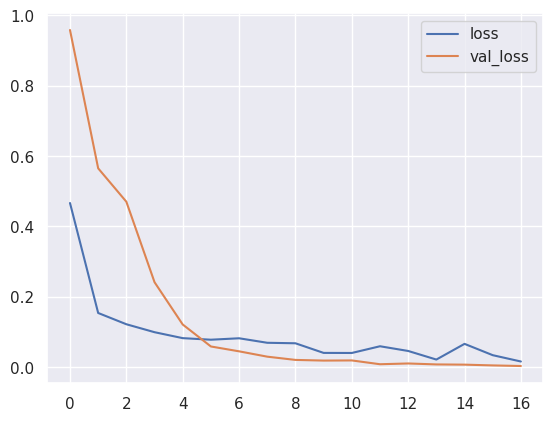

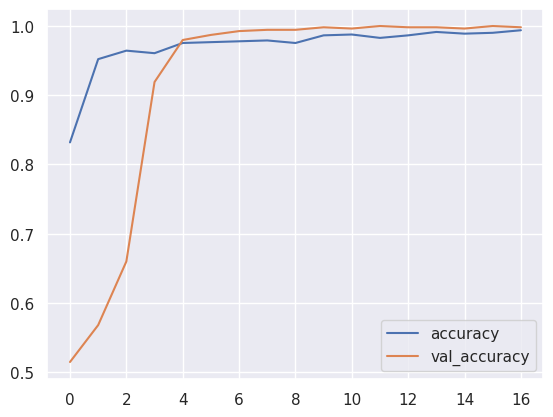

In [ ]:
model_history = pd.DataFrame(history.history)
model_history.loc[:, ['loss', 'val_loss']].plot()
model_history.loc[:, ['accuracy', 'val_accuracy']].plot()

In [ ]:
print('Accuracy for Train: {:.4f}'.format(model_history['accuracy'].mean()))
print('Loss for Train: {:.4f}'.format(model_history['loss'].mean()))
print('Accuracy for Test: {:.4f}'.format(model_history['val_accuracy'].mean()))
print('Loss for Test: {:.4f}'.format(model_history['val_loss'].mean()))

Accuracy for Train: 0.9707
Loss for Train: 0.0910
Accuracy for Test: 0.9174
Loss for Test: 0.1524


In [ ]:
start = time.time()
predict_labels_ = model_alexnet.predict(true_images)
duration = time.time() - start

loss_object = SparseCategoricalCrossentropy(from_logits=True)
true_labels_1 = tf.reshape(true_labels, (-1,))
loss = loss_object(true_labels_1,predict_labels_)

predict_labels = np.argmax(model_alexnet.predict(true_images), axis=1)

print("Accuracy: {:0.4f}".format(accuracy_score(true_labels, predict_labels)))
print("Loss: {:0.4f}".format(loss))
print("Inference Time: {:.2f}s".format(duration))
print("Precision: {:0.4f}".format(precision_score(true_labels, predict_labels)))
print("Recall: {:0.4f}".format(recall_score(true_labels, predict_labels)))
print("F1-Score: {:0.4f}".format(f1_score(true_labels, predict_labels)))
print("AUC: {:0.4f}".format(roc_auc_score(true_labels, predict_labels)))
print("MCC: {:0.4f}".format(matthews_corrcoef(true_labels, predict_labels)))

Accuracy: 1.0000
Loss: 0.0022
Inference Time: 0.76s
Precision: 1.0000
Recall: 1.0000
F1-Score: 1.0000
AUC: 1.0000
MCC: 1.0000


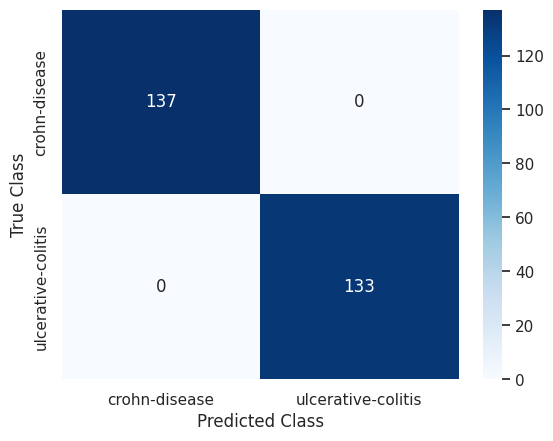

In [ ]:
conf_matrix = pd.DataFrame(confusion_matrix(true_labels, predict_labels), columns=['crohn-disease', 'ulcerative-colitis'], index=['crohn-disease', 'ulcerative-colitis'])
ax = sns.heatmap(conf_matrix, annot=True, fmt='', cmap='Blues')
ax.set(xlabel='Predicted Class', ylabel='True Class')
plt.show()

In [ ]:
for _images, ax in zip(image_interpretability_3, axis.flat):
  img_array = read_and_transform_img(_images)

  preds = model_alexnet.predict(img_array)
  if np.argmax(preds, axis=1) == 0: print('crohn-disease')
  else: print('ulcerative-colitis')

crohn-disease
crohn-disease
ulcerative-colitis
ulcerative-colitis
ulcerative-colitis
crohn-disease


<h1>Knowledge Distillation</h1>

In [ ]:
distillation_ = Distiller(student=student_model, teacher=model_alexnet)

distillation_.compile(
    optimizer=Adam(learning_rate=1e-4),
    metrics=['accuracy'],
    student_loss_fn=SparseCategoricalCrossentropy(from_logits=True), 
    distillation_loss_fn=KLDivergence(),
    alpha=0.8,
    temperature=105)

In [ ]:
distillation_history = distillation_.fit(train_ds, epochs=100, validation_data=test_ds, callbacks=[early_stopping])

Epoch 1/100
26/26 [==============================] - 11s 266ms/step - accuracy: 0.5006 - student_loss: 0.7554 - distillation_loss: 24.5161 - val_accuracy: 0.5129 - val_student_loss: 6.6666
Epoch 2/100
26/26 [==============================] - 5s 189ms/step - accuracy: 0.5939 - student_loss: 0.6258 - distillation_loss: 16.2860 - val_accuracy: 0.5239 - val_student_loss: 1.0358
Epoch 3/100
26/26 [==============================] - 5s 188ms/step - accuracy: 0.8331 - student_loss: 0.3536 - distillation_loss: 13.9114 - val_accuracy: 0.5864 - val_student_loss: 1.5728
Epoch 4/100
26/26 [==============================] - 5s 186ms/step - accuracy: 0.9252 - student_loss: 0.2035 - distillation_loss: 10.1082 - val_accuracy: 0.5221 - val_student_loss: 2.4805
Epoch 5/100
26/26 [==============================] - 5s 192ms/step - accuracy: 0.9669 - student_loss: 0.1022 - distillation_loss: 8.9947 - val_accuracy: 0.7482 - val_student_loss: 0.7340
Epoch 6/100
26/26 [==============================] - 5s 191m

<Axes: >

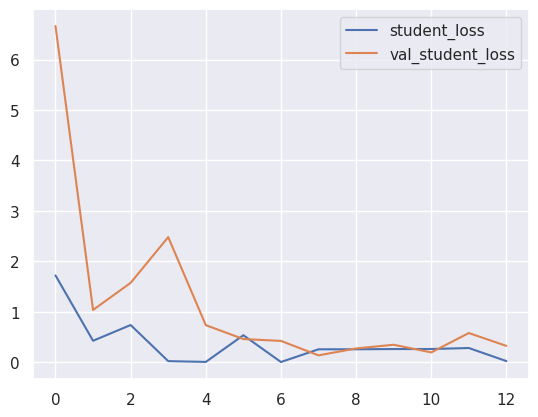

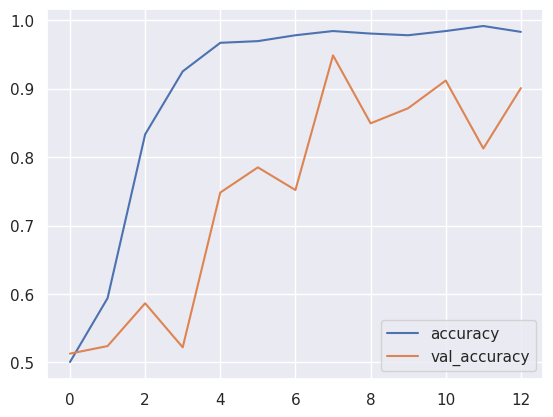

In [ ]:
distiller_history = pd.DataFrame(distillation_history.history)
distiller_history.loc[:, ['student_loss', 'val_student_loss']].plot()
distiller_history.loc[:, ['accuracy', 'val_accuracy']].plot()

In [ ]:
print('Accuracy for Train: {:.4f}'.format(distiller_history['accuracy'].mean()))
print('Loss for Train: {:.4f}'.format(distiller_history['student_loss'].mean()))
print('Accuracy for Test: {:.4f}'.format(distiller_history['val_accuracy'].mean()))
print('Loss for Test: {:.4f}'.format(distiller_history['val_student_loss'].mean()))

Accuracy for Train: 0.8975
Loss for Train: 0.3675
Accuracy for Test: 0.7480
Loss for Test: 1.1704


In [ ]:
start_dist = time.time()
predict_labels_dist = distillation_.predict(true_images)
duration_dist = time.time() - start_dist

loss_object = SparseCategoricalCrossentropy(from_logits=True)
true_labels_dist = tf.reshape(true_labels, (-1,))
loss_dist = loss_object(true_labels_dist,predict_labels_dist)

predict_labels_distiller = np.argmax(distillation_.predict(true_images), axis=1)

print("Accuracy: {:0.4f}".format(accuracy_score(true_labels, predict_labels_distiller)))
print("Loss: {:0.4f}".format(loss_dist))
print("Inference Time: {:.2f}s".format(duration_dist))
print("Precision: {:0.4f}".format(precision_score(true_labels, predict_labels_distiller)))
print("Recall: {:0.4f}".format(recall_score(true_labels, predict_labels_distiller)))
print("F1-Score: {:0.4f}".format(f1_score(true_labels, predict_labels_distiller)))
print("AUC: {:0.4f}".format(roc_auc_score(true_labels, predict_labels_distiller)))
print("MCC: {:0.4f}".format(matthews_corrcoef(true_labels, predict_labels_distiller)))

Accuracy: 0.8963
Loss: 0.2241
Inference Time: 1.52s
Precision: 0.8261
Recall: 1.0000
F1-Score: 0.9048
AUC: 0.8978
MCC: 0.8107


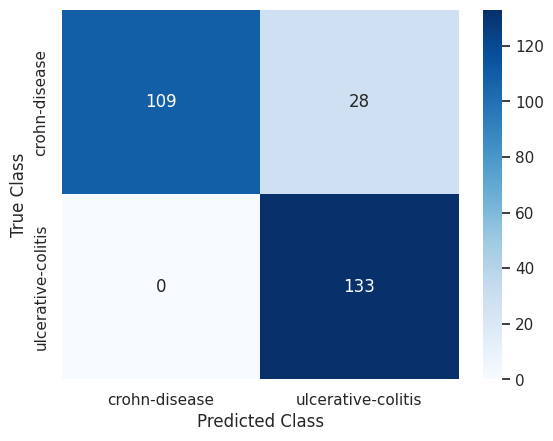

In [ ]:
conf_matrix_distiller = pd.DataFrame(confusion_matrix(true_labels, predict_labels_distiller), columns=['crohn-disease', 'ulcerative-colitis'], index=['crohn-disease', 'ulcerative-colitis'])
ax = sns.heatmap(conf_matrix_distiller, annot=True, fmt='', cmap='Blues')
ax.set(xlabel='Predicted Class', ylabel='True Class')
plt.show()

In [ ]:
for _images, ax in zip(image_interpretability_3, axis.flat):
  img_array = read_and_transform_img(_images)

  preds_dist = distillation_.predict(img_array)
  if np.argmax(preds_dist, axis=1) == 0: print('crohn-disease')
  else: print('ulcerative-colitis')

ulcerative-colitis
crohn-disease
ulcerative-colitis
ulcerative-colitis
ulcerative-colitis
crohn-disease


<h1>Interpretability of Teacher</h1>

<h3>Grad-Cam</h3>

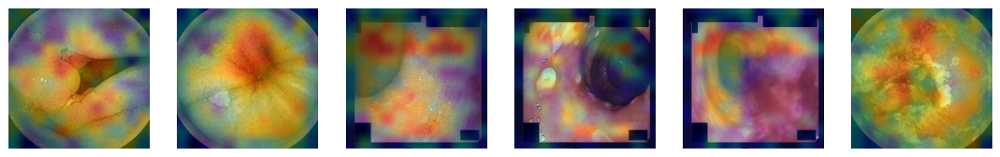

In [ ]:
last_conv_layer_name = "conv2d_12"

fig, axis = plt.subplots(1, 6, figsize=(15, 15))
for _images, ax in zip(image_interpretability_3, axis.flat):
  img_array = read_and_transform_img(_images)

  model_alexnet.layers[-1].activation = None

  preds = model_alexnet.predict(img_array)
  heatmap = make_gradcam_heatmap_CNN(img_array, model_alexnet, last_conv_layer_name)

  heatmap = np.reshape(heatmap, (-1,12))
  display_gradcam(_images, heatmap, preds=preds[0], plot=ax)

<h3>LIME</h3>

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

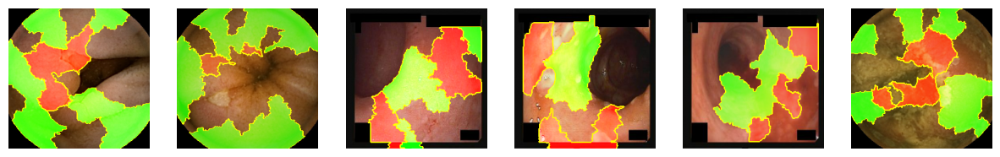

In [ ]:
explainer = lime_image.LimeImageExplainer()

fig, axis = plt.subplots(1, 6, figsize=(15, 15))
for _images, ax in zip(image_interpretability_3, axis.flat):
  img_array = read_and_transform_img(_images)
    
  explanation = explainer.explain_instance(img_array[0].astype(np.uint8), model_alexnet.predict, hide_color=0, num_samples=1000)
  temp_, mask_ = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=False, num_features=10, hide_rest=False)

  ax.imshow(mark_boundaries(temp_, mask_))
  ax.axis('off')

<h3>Shapley Values</h3>

array([[[[ 0.      ,  0.      ,  0.      ],
         [ 0.      ,  0.      ,  0.      ],
         [ 0.      ,  0.      ,  0.      ],
         ...,
         [ 0.      ,  0.      ,  0.      ],
         [ 0.      ,  0.      ,  0.      ],
         [ 0.      ,  0.      ,  0.      ]],

        [[ 0.      ,  0.      ,  0.      ],
         [ 0.      ,  0.      ,  0.      ],
         [ 0.      ,  0.      ,  0.      ],
         ...,
         [ 0.      ,  0.      ,  0.      ],
         [ 0.      ,  0.      ,  0.      ],
         [ 0.      ,  0.      ,  0.      ]],

        [[ 0.      ,  0.      ,  0.      ],
         [ 0.      ,  0.      ,  0.      ],
         [ 0.      ,  0.      ,  0.      ],
         ...,
         [ 0.      ,  0.      ,  0.      ],
         [ 0.      ,  0.      ,  0.      ],
         [ 0.      ,  0.      ,  0.      ]],

        ...,

        [[ 0.      ,  0.      ,  0.      ],
         [ 0.      ,  0.      ,  0.      ],
         [ 0.      ,  0.      ,  0.      ],
         ...,


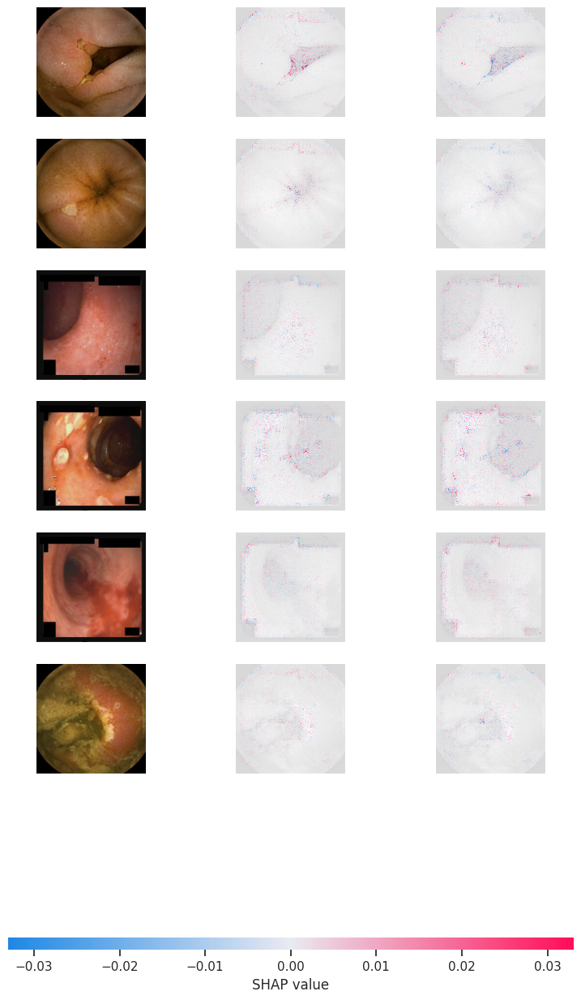

In [ ]:
images_train, labels_train = tuple(zip(*train_ds))
images_train_1 = np.concatenate(images_train)

shap_values = shap.GradientExplainer(model_alexnet, images_train_1).shap_values(image_interpretability_3)
shap.image_plot(shap_values, image_interpretability_3)

<h3>RISE (Randomized Image Sampling for Explanations)</h3>

In [ ]:
model_rise = RISE(1000, 8, 0.5, model_alexnet, batch_size,IMG_SIZE)
masks = model_rise.generate_masks()

Generating masks: 100%|██████████| 1000/1000 [00:02<00:00, 459.17it/s]


Explaining: 100%|██████████| 32/32 [00:02<00:00, 14.98it/s]


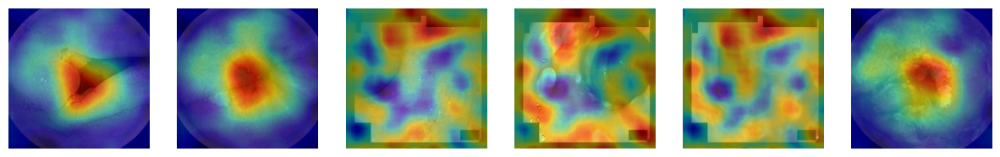

In [ ]:
idx = 0
fig, axis = plt.subplots(1, 6, figsize=(15, 15))
for _images, ax in zip(image_interpretability_3, axis.flat):
  img_array = read_and_transform_img(_images)

  sal = model_rise.explain(img_array, masks)

  ax.imshow(_images.astype(np.uint8))
  ax.imshow(sal[int(labels_interpretability_3[idx])], cmap='jet', alpha=0.5)
  ax.axis('off')

  idx += 1

<h3>Occlusion Sensitivity</h3>

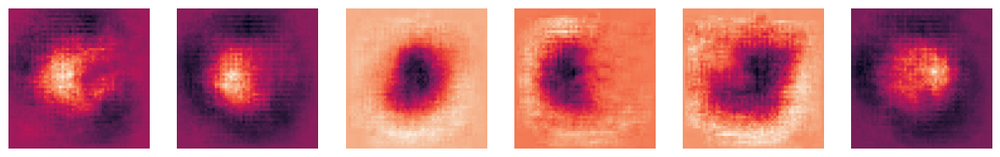

In [ ]:
idx = 0

fig, axis = plt.subplots(1, 6, figsize=(15, 15))
for _images, ax in zip(image_interpretability_3, axis.flat):
  occ = OcclusionMaps(_images)
  heatmap_occ = occ.get_heatmap(model_alexnet, 4, int(labels_interpretability_3[idx]), IMG_SIZE[0])

  ax.imshow(heatmap_occ)
  # ax.imshow(_images.astype(np.uint8), cmap='gray')
  # ax.pcolormesh(heatmap_occ, cmap='jet', alpha=0.35)
  ax.axis('off')

  idx += 1

<h1>Interpretability of Student</h1>

<h3>LIME</h3>

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

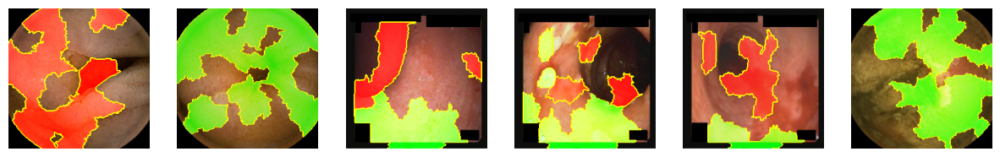

In [ ]:
explainer = lime_image.LimeImageExplainer()

fig, axis = plt.subplots(1, 6, figsize=(15, 15))
for _images, ax in zip(image_interpretability_3, axis.flat):
  img_array = read_and_transform_img(_images)
    
  explanation = explainer.explain_instance(img_array[0].astype(np.uint8), distillation_.predict, hide_color=0, num_samples=1000)
  temp_, mask_ = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=False, num_features=10, hide_rest=False)

  ax.imshow(mark_boundaries(temp_, mask_))
  ax.axis('off')

<h3>RISE (Randomized Image Sampling for Explanations)</h3>

In [ ]:
model_rise = RISE(1000, 8, 0.5, distillation_, batch_size,IMG_SIZE)
masks = model_rise.generate_masks()

Generating masks: 100%|██████████| 1000/1000 [00:02<00:00, 409.50it/s]


Explaining: 100%|██████████| 32/32 [00:02<00:00, 11.76it/s]


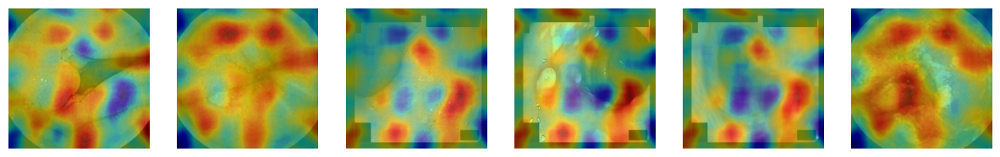

In [ ]:
idx = 0
fig, axis = plt.subplots(1, 6, figsize=(15, 15))
for _images, ax in zip(image_interpretability_3, axis.flat):
  img_array = read_and_transform_img(_images)

  sal = model_rise.explain(img_array, masks)

  ax.imshow(_images.astype(np.uint8))
  ax.imshow(sal[int(labels_interpretability_3[idx])], cmap='jet', alpha=0.5)
  ax.axis('off')

  idx += 1

<h3>Occlusion Sensitivity</h3>

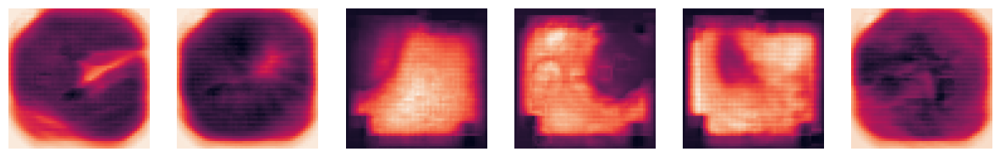

In [ ]:
idx = 0

fig, axis = plt.subplots(1, 6, figsize=(15, 15))
for _images, ax in zip(image_interpretability_3, axis.flat):
  occ = OcclusionMaps(_images)
  heatmap = occ.get_heatmap(distillation_, 4, int(labels_interpretability_3[idx]), IMG_SIZE[0])

  ax.imshow(heatmap)
  # ax.imshow(_images.astype(np.uint8), cmap=plt.cm.gray)
  # ax.pcolormesh(heatmap, cmap=plt.cm.jet, alpha=0.20)
  ax.axis('off')

  idx += 1

# ResNet50

In [ ]:
inputs = Input(shape=(224, 224, 3))
x = data_augmentation(inputs)
x = preprocess_input_resnet(x)
x = ResNet50(weights='imagenet', include_top=False, pooling='avg', input_tensor=x)
outputs = layers.Dense(len(class_names))(x.output)
model_resnet50 = Model(inputs, outputs)

94781440/94765736 [==============================] - 0s 0us/step


In [ ]:
model_resnet50.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 sequential (Sequential)        (None, 224, 224, 3)  0           ['input_2[0][0]']                
                                                                                                  
 tf.__operators__.getitem (Slic  (None, 224, 224, 3)  0          ['sequential[1][0]']             
 ingOpLambda)                                                                                     
                                                                                            

In [ ]:
model_resnet50.compile(loss=SparseCategoricalCrossentropy(from_logits=True), optimizer=Adam(learning_rate=1e-5), metrics=['accuracy'])

In [ ]:
history_resnet50 = model_resnet50.fit(train_ds, epochs=200, validation_data=test_ds, callbacks=[early_stopping])

Epoch 1/200
26/26 [==============================] - 28s 463ms/step - loss: 0.1942 - accuracy: 0.9460 - val_loss: 0.1365 - val_accuracy: 0.9651
Epoch 2/200
26/26 [==============================] - 10s 382ms/step - loss: 0.0305 - accuracy: 0.9988 - val_loss: 0.0578 - val_accuracy: 0.9982
Epoch 3/200
26/26 [==============================] - 10s 386ms/step - loss: 0.0165 - accuracy: 0.9988 - val_loss: 0.0307 - val_accuracy: 1.0000
Epoch 4/200
26/26 [==============================] - 10s 386ms/step - loss: 0.0117 - accuracy: 1.0000 - val_loss: 0.0168 - val_accuracy: 1.0000
Epoch 5/200
26/26 [==============================] - 10s 389ms/step - loss: 0.0066 - accuracy: 1.0000 - val_loss: 0.0123 - val_accuracy: 1.0000
Epoch 6/200
26/26 [==============================] - 10s 394ms/step - loss: 0.0060 - accuracy: 1.0000 - val_loss: 0.0070 - val_accuracy: 1.0000
Epoch 7/200
26/26 [==============================] - 10s 400ms/step - loss: 0.0044 - accuracy: 1.0000 - val_loss: 0.0055 - val_accuracy:

<Axes: >

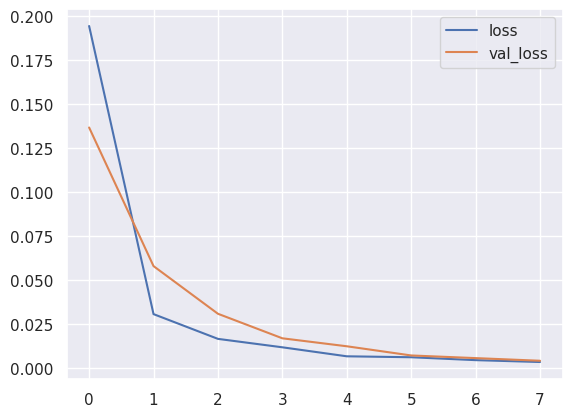

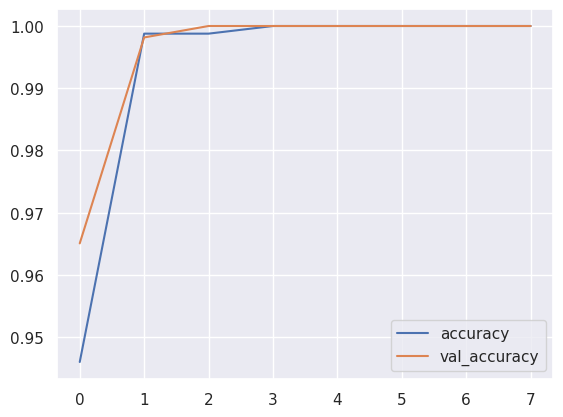

In [ ]:
model_history_resnet50 = pd.DataFrame(history_resnet50.history)
model_history_resnet50.loc[:, ['loss', 'val_loss']].plot()
model_history_resnet50.loc[:, ['accuracy', 'val_accuracy']].plot()

In [ ]:
print('Accuracy for Train: {:.4f}'.format(model_history_resnet50['accuracy'].mean()))
print('Loss for Train: {:.4f}'.format(model_history_resnet50['loss'].mean()))
print('Accuracy for Test: {:.4f}'.format(model_history_resnet50['val_accuracy'].mean()))
print('Loss for Test: {:.4f}'.format(model_history_resnet50['val_loss'].mean()))

Accuracy for Train: 0.9929
Loss for Train: 0.0341
Accuracy for Test: 0.9954
Loss for Test: 0.0338


In [ ]:
start = time.time()
predict_labels_ = model_resnet50.predict(true_images)
duration = time.time() - start

loss_object = SparseCategoricalCrossentropy(from_logits=True)
true_labels_1 = tf.reshape(true_labels, (-1,))
loss = loss_object(true_labels_1,predict_labels_)

predict_labels_resnet50 = np.argmax(model_resnet50.predict(true_images), axis=1)

print("Accuracy: {:0.4f}".format(accuracy_score(true_labels, predict_labels_resnet50)))
print("Loss: {:0.4f}".format(loss))
print("Inference Time: {:.2f}s".format(duration))
print("Precision: {:0.4f}".format(precision_score(true_labels, predict_labels_resnet50)))
print("Recall: {:0.4f}".format(recall_score(true_labels, predict_labels_resnet50)))
print("F1-Score: {:0.4f}".format(f1_score(true_labels, predict_labels_resnet50)))
print("AUC: {:0.4f}".format(roc_auc_score(true_labels, predict_labels_resnet50)))
print("MCC: {:0.4f}".format(matthews_corrcoef(true_labels, predict_labels_resnet50)))

Accuracy: 1.0000
Loss: 0.0044
Inference Time: 2.44s
Precision: 1.0000
Recall: 1.0000
F1-Score: 1.0000
AUC: 1.0000
MCC: 1.0000


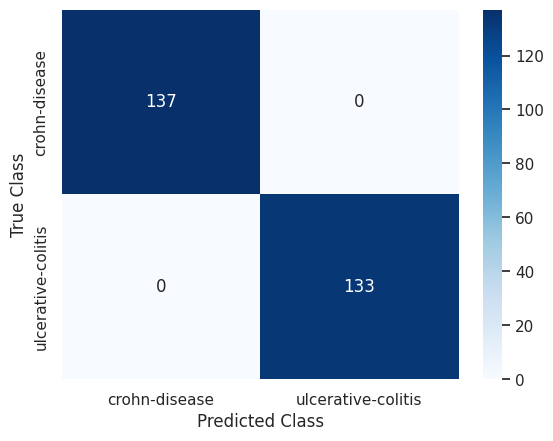

In [ ]:
conf_matrix_resnet50 = pd.DataFrame(confusion_matrix(true_labels, predict_labels_resnet50), columns=['crohn-disease', 'ulcerative-colitis'], index=['crohn-disease', 'ulcerative-colitis'])
ax = sns.heatmap(conf_matrix_resnet50, annot=True, fmt='', cmap='Blues')
ax.set(xlabel='Predicted Class', ylabel='True Class')
plt.show()

In [ ]:
for _images, ax in zip(image_interpretability_3, axis.flat):
  img_array = read_and_transform_img(_images)

  preds = model_resnet50.predict(img_array)
  if np.argmax(preds, axis=1) == 0: print('crohn-disease')
  else: print('ulcerative-colitis')

ulcerative-colitis
ulcerative-colitis
ulcerative-colitis
crohn-disease
crohn-disease
crohn-disease


<h1>Knowledge Distillation</h1>

In [ ]:
distillation_ = Distiller(student=student_model, teacher=model_resnet50)

distillation_.compile(
    optimizer=Adam(learning_rate=1e-4),
    metrics=['accuracy'],
    student_loss_fn=SparseCategoricalCrossentropy(from_logits=True), 
    distillation_loss_fn=KLDivergence(),
    alpha=0.8,
    temperature=105)

In [ ]:
distillation_history = distillation_.fit(train_ds, epochs=100, validation_data=test_ds, callbacks=[early_stopping])

Epoch 1/100
26/26 [==============================] - 14s 348ms/step - accuracy: 0.5264 - student_loss: 0.5980 - distillation_loss: 6.1115 - val_accuracy: 0.7353 - val_student_loss: 0.8615
Epoch 2/100
26/26 [==============================] - 7s 275ms/step - accuracy: 0.7178 - student_loss: 0.4318 - distillation_loss: 3.7819 - val_accuracy: 0.6415 - val_student_loss: 0.8170
Epoch 3/100
26/26 [==============================] - 7s 280ms/step - accuracy: 0.8822 - student_loss: 0.3105 - distillation_loss: 3.1095 - val_accuracy: 0.5239 - val_student_loss: 1.4047
Epoch 4/100
26/26 [==============================] - 7s 279ms/step - accuracy: 0.9362 - student_loss: 0.1914 - distillation_loss: 2.9566 - val_accuracy: 0.5074 - val_student_loss: 1.4435
Epoch 5/100
26/26 [==============================] - 7s 283ms/step - accuracy: 0.9742 - student_loss: 0.0977 - distillation_loss: 2.1671 - val_accuracy: 0.5110 - val_student_loss: 2.2275
Epoch 6/100
26/26 [==============================] - 7s 281ms/st

<Axes: >

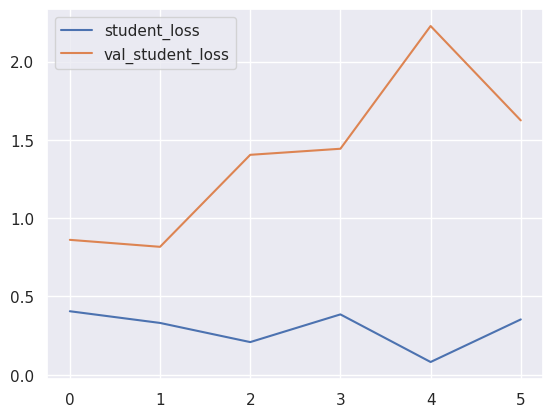

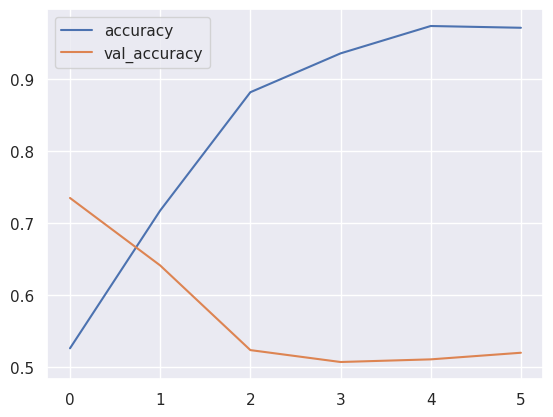

In [ ]:
distiller_history = pd.DataFrame(distillation_history.history)
distiller_history.loc[:, ['student_loss', 'val_student_loss']].plot()
distiller_history.loc[:, ['accuracy', 'val_accuracy']].plot()

In [ ]:
print('Accuracy for Train: {:.4f}'.format(distiller_history['accuracy'].mean()))
print('Loss for Train: {:.4f}'.format(distiller_history['student_loss'].mean()))
print('Accuracy for Test: {:.4f}'.format(distiller_history['val_accuracy'].mean()))
print('Loss for Test: {:.4f}'.format(distiller_history['val_student_loss'].mean()))

Accuracy for Train: 0.8348
Loss for Train: 0.2941
Accuracy for Test: 0.5732
Loss for Test: 1.3965


In [ ]:
start_dist = time.time()
predict_labels_dist = distillation_.predict(true_images)
duration_dist = time.time() - start_dist

loss_object = SparseCategoricalCrossentropy(from_logits=True)
true_labels_dist = tf.reshape(true_labels, (-1,))
loss_dist = loss_object(true_labels_dist,predict_labels_dist)

predict_labels_distiller = np.argmax(distillation_.predict(true_images), axis=1)

print("Accuracy: {:0.4f}".format(accuracy_score(true_labels, predict_labels_distiller)))
print("Loss: {:0.4f}".format(loss_dist))
print("Inference Time: {:.2f}s".format(duration_dist))
print("Precision: {:0.4f}".format(precision_score(true_labels, predict_labels_distiller)))
print("Recall: {:0.4f}".format(recall_score(true_labels, predict_labels_distiller)))
print("F1-Score: {:0.4f}".format(f1_score(true_labels, predict_labels_distiller)))
print("AUC: {:0.4f}".format(roc_auc_score(true_labels, predict_labels_distiller)))
print("MCC: {:0.4f}".format(matthews_corrcoef(true_labels, predict_labels_distiller)))

Accuracy: 0.5037
Loss: 1.3675
Inference Time: 1.55s
Precision: 0.4981
Recall: 1.0000
F1-Score: 0.6650
AUC: 0.5109
MCC: 0.1044


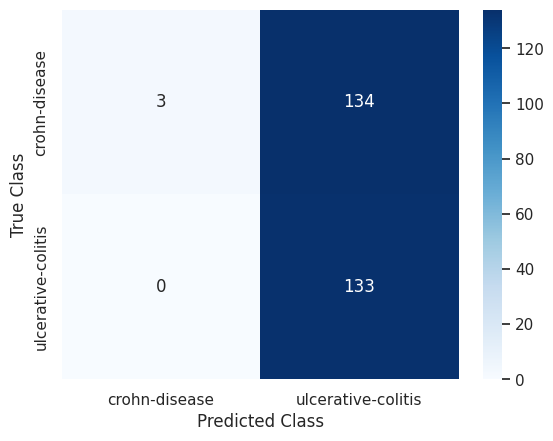

In [ ]:
conf_matrix_distiller = pd.DataFrame(confusion_matrix(true_labels, predict_labels_distiller), columns=['crohn-disease', 'ulcerative-colitis'], index=['crohn-disease', 'ulcerative-colitis'])
ax = sns.heatmap(conf_matrix_distiller, annot=True, fmt='', cmap='Blues')
ax.set(xlabel='Predicted Class', ylabel='True Class')
plt.show()

In [ ]:
for _images, ax in zip(image_interpretability_3, axis.flat):
  img_array = read_and_transform_img(_images)

  preds_dist = distillation_.predict(img_array)
  if np.argmax(preds_dist, axis=1) == 0: print('crohn-disease')
  else: print('ulcerative-colitis')

ulcerative-colitis
ulcerative-colitis
ulcerative-colitis
ulcerative-colitis
ulcerative-colitis
ulcerative-colitis


<h1>Interpretability of Teacher</h1>

<h3>Grad-Cam</h3>

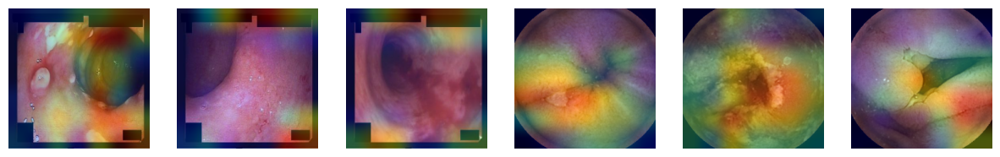

In [ ]:
last_conv_layer_name = "conv5_block3_3_conv"

fig, axis = plt.subplots(1, 6, figsize=(15, 15))
for _images, ax in zip(image_interpretability_3, axis.flat):
  img_array = read_and_transform_img(_images)

  model_resnet50.layers[-1].activation = None

  preds = model_resnet50.predict(img_array)
  heatmap = make_gradcam_heatmap_CNN(img_array, model_resnet50, last_conv_layer_name)

  heatmap = np.reshape(heatmap, (-1,7))
  display_gradcam(_images, heatmap, preds=preds[0], plot=ax)

<h3>LIME</h3>

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

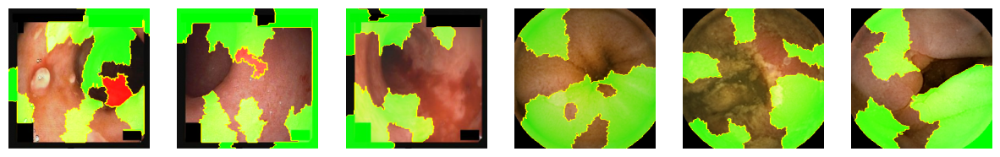

In [ ]:
explainer = lime_image.LimeImageExplainer()

fig, axis = plt.subplots(1, 6, figsize=(15, 15))
for _images, ax in zip(image_interpretability_3, axis.flat):
  img_array = read_and_transform_img(_images)
    
  explanation = explainer.explain_instance(img_array[0].astype(np.uint8), model_resnet50.predict, hide_color=0, num_samples=1000)
  temp_, mask_ = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=False, num_features=10, hide_rest=False)

  ax.imshow(mark_boundaries(temp_, mask_))
  ax.axis('off')

<h3>Shap Values</h3>

`tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.


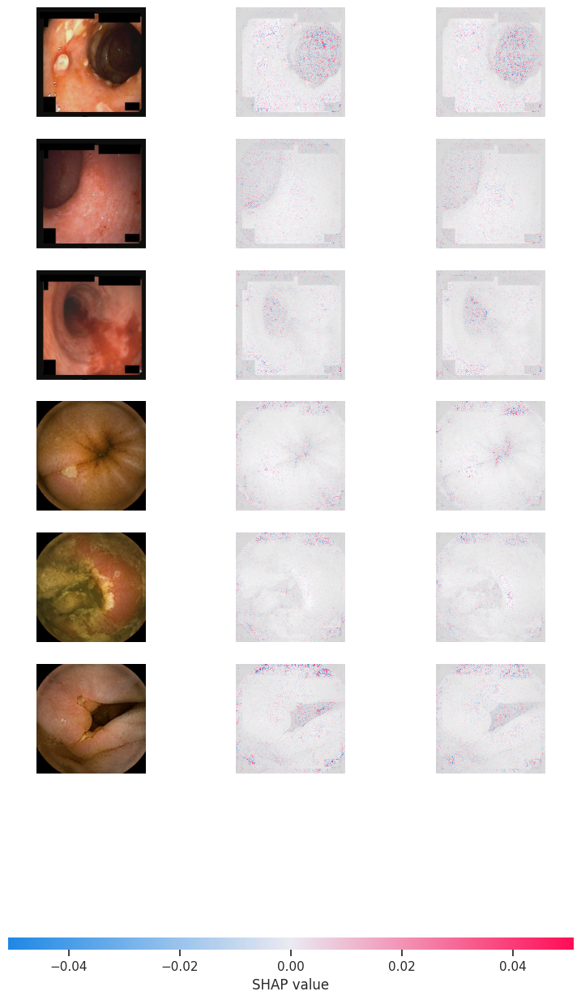

In [ ]:
images_train, labels_train = tuple(zip(*train_ds))
images_train_1 = np.concatenate(images_train)

shap_values = shap.GradientExplainer(model_resnet50, images_train_1).shap_values(image_interpretability_3)
shap.image_plot(shap_values, image_interpretability_3)

<h3>RISE (Randomized Image Sampling for Explanations)</h3>

In [ ]:
model_rise = RISE(1000, 8, 0.5, model_resnet50, batch_size,IMG_SIZE)
masks = model_rise.generate_masks()

Generating masks: 100%|██████████| 1000/1000 [00:02<00:00, 439.43it/s]


Explaining: 100%|██████████| 32/32 [00:04<00:00,  7.23it/s]


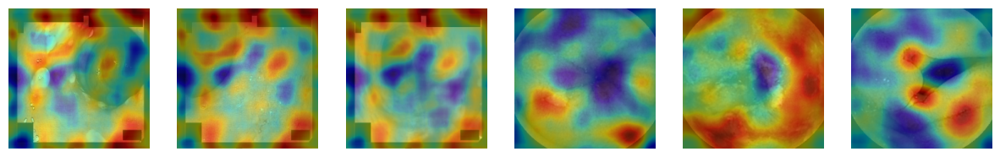

In [ ]:
idx = 0
fig, axis = plt.subplots(1, 6, figsize=(15, 15))
for _images, ax in zip(image_interpretability_3, axis.flat):
  img_array = read_and_transform_img(_images)

  sal = model_rise.explain(img_array, masks)

  ax.imshow(_images.astype(np.uint8))
  ax.imshow(sal[int(labels_interpretability_3[idx])], cmap='jet', alpha=0.5)
  ax.axis('off')

  idx += 1

<h3>Occlusion Sensitivity</h3>

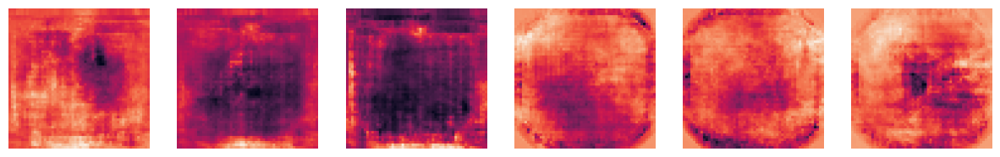

In [ ]:
idx = 0

fig, axis = plt.subplots(1, 6, figsize=(15, 15))
for _images, ax in zip(image_interpretability_3, axis.flat):
  occ = OcclusionMaps(_images)
  heatmap_occ = occ.get_heatmap(model_resnet50, 4, int(labels_interpretability_3[idx]), IMG_SIZE[0])

  ax.imshow(heatmap_occ)
  ax.axis('off')

  idx += 1

<h1>Interpretability of Student</h1>

<h3>LIME</h3>

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

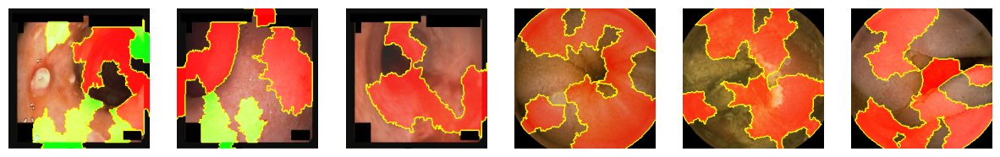

In [ ]:
explainer = lime_image.LimeImageExplainer()

fig, axis = plt.subplots(1, 6, figsize=(15, 15))
for _images, ax in zip(image_interpretability_3, axis.flat):
  img_array = read_and_transform_img(_images)
    
  explanation = explainer.explain_instance(img_array[0].astype(np.uint8), distillation_.predict, hide_color=0, num_samples=1000)
  temp_, mask_ = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=False, num_features=10, hide_rest=False)

  ax.imshow(mark_boundaries(temp_, mask_))
  ax.axis('off')

<h3>RISE (Randomized Image Sampling for Explanations)</h3>

In [ ]:
model_rise = RISE(1000, 8, 0.5, distillation_, batch_size,IMG_SIZE)
masks = model_rise.generate_masks()

Generating masks: 100%|██████████| 1000/1000 [00:02<00:00, 440.85it/s]


Explaining: 100%|██████████| 32/32 [00:02<00:00, 11.31it/s]


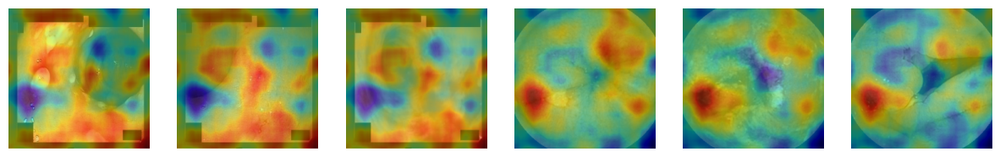

In [ ]:
idx = 0
fig, axis = plt.subplots(1, 6, figsize=(15, 15))
for _images, ax in zip(image_interpretability_3, axis.flat):
  img_array = read_and_transform_img(_images)

  sal = model_rise.explain(img_array, masks)

  ax.imshow(_images.astype(np.uint8))
  ax.imshow(sal[int(labels_interpretability_3[idx])], cmap='jet', alpha=0.5)
  ax.axis('off')

  idx += 1

<h3>Occlusion Sensitivity</h3>

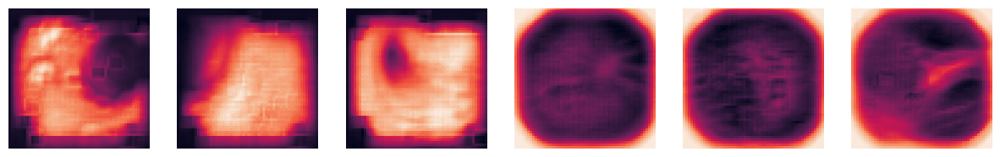

In [ ]:
idx = 0

fig, axis = plt.subplots(1, 6, figsize=(15, 15))
for _images, ax in zip(image_interpretability_3, axis.flat):
  occ = OcclusionMaps(_images)
  heatmap_occ_1 = occ.get_heatmap(distillation_, 4, int(labels_interpretability_3[idx]), IMG_SIZE[0])

  ax.imshow(heatmap_occ_1)
  ax.axis('off')

  idx += 1

# VGG16

In [ ]:
inputs = Input(shape=(224,224,3))
x = data_augmentation(inputs)
x = preprocess_input_vgg16(x)
x = VGG16(weights='imagenet', include_top=False, input_tensor=x)
x = layers.Flatten()(x.output)
x = layers.Dense(4096,activation='relu')(x)
x = layers.Dense(4096,activation='relu')(x)
outputs = layers.Dense(len(class_names))(x)
model_vgg16 = Model(inputs, outputs)

58900480/58889256 [==============================] - 0s 0us/step


In [ ]:
model_vgg16.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 sequential (Sequential)     (None, 224, 224, 3)       0         
                                                                 
 tf.__operators__.getitem (S  (None, 224, 224, 3)      0         
 licingOpLambda)                                                 
                                                                 
 tf.nn.bias_add (TFOpLambda)  (None, 224, 224, 3)      0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                           

In [ ]:
model_vgg16.compile(loss=SparseCategoricalCrossentropy(from_logits=True), optimizer=Adam(learning_rate=1e-5), metrics=['accuracy'])

In [ ]:
history_vgg = model_vgg16.fit(train_ds, epochs=200, validation_data=test_ds, callbacks=[early_stopping])

Epoch 1/200
26/26 [==============================] - 29s 737ms/step - loss: 0.2932 - accuracy: 0.9521 - val_loss: 0.0067 - val_accuracy: 0.9982
Epoch 2/200
26/26 [==============================] - 15s 584ms/step - loss: 1.0140e-05 - accuracy: 1.0000 - val_loss: 6.8187e-04 - val_accuracy: 1.0000
Epoch 3/200
26/26 [==============================] - 16s 617ms/step - loss: 0.0019 - accuracy: 0.9988 - val_loss: 7.4012e-05 - val_accuracy: 1.0000
Epoch 4/200
26/26 [==============================] - 16s 622ms/step - loss: 0.0163 - accuracy: 0.9988 - val_loss: 0.0012 - val_accuracy: 1.0000
Epoch 5/200
26/26 [==============================] - 16s 603ms/step - loss: 0.0011 - accuracy: 1.0000 - val_loss: 3.1572e-04 - val_accuracy: 1.0000
Epoch 6/200
26/26 [==============================] - 15s 589ms/step - loss: 0.0029 - accuracy: 0.9988 - val_loss: 1.5850e-06 - val_accuracy: 1.0000
Epoch 7/200
26/26 [==============================] - 15s 589ms/step - loss: 1.5166e-04 - accuracy: 1.0000 - val_loss

<Axes: >

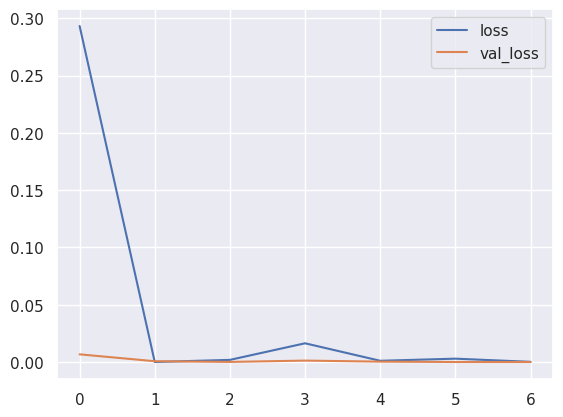

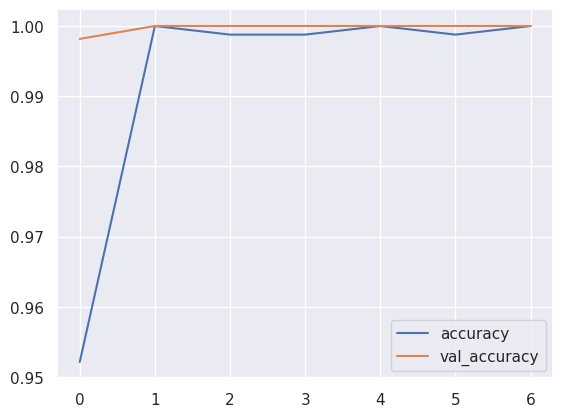

In [ ]:
model_history_vgg = pd.DataFrame(history_vgg.history)
model_history_vgg.loc[:, ['loss', 'val_loss']].plot()
model_history_vgg.loc[:, ['accuracy', 'val_accuracy']].plot()

In [ ]:
print('Accuracy for Train: {:.4f}'.format(model_history_vgg['accuracy'].mean()))
print('Loss for Train: {:.4f}'.format(model_history_vgg['loss'].mean()))
print('Accuracy for Test: {:.4f}'.format(model_history_vgg['val_accuracy'].mean()))
print('Loss for Test: {:.4f}'.format(model_history_vgg['val_loss'].mean()))

Accuracy for Train: 0.9926
Loss for Train: 0.0451
Accuracy for Test: 0.9997
Loss for Test: 0.0013


In [ ]:
start = time.time()
predict_labels_ = model_vgg16.predict(true_images)
duration = time.time() - start

loss_object = SparseCategoricalCrossentropy(from_logits=True)
true_labels_1 = tf.reshape(true_labels, (-1,))
loss = loss_object(true_labels_1,predict_labels_)

predict_labels_vgg = np.argmax(model_vgg16.predict(true_images), axis=1)

print("Accuracy: {:0.4f}".format(accuracy_score(true_labels, predict_labels_vgg)))
print("Loss: {:0.4f}".format(loss))
print("Inference Time: {:.2f}s".format(duration))
print("Precision: {:0.4f}".format(precision_score(true_labels, predict_labels_vgg)))
print("Recall: {:0.4f}".format(recall_score(true_labels, predict_labels_vgg)))
print("F1-Score: {:0.4f}".format(f1_score(true_labels, predict_labels_vgg)))
print("AUC: {:0.4f}".format(roc_auc_score(true_labels, predict_labels_vgg)))
print("MCC: {:0.4f}".format(matthews_corrcoef(true_labels, predict_labels_vgg)))

Accuracy: 1.0000
Loss: 0.0000
Inference Time: 3.43s
Precision: 1.0000
Recall: 1.0000
F1-Score: 1.0000
AUC: 1.0000
MCC: 1.0000


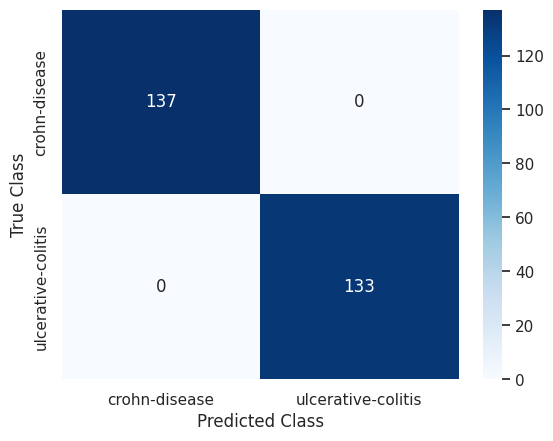

In [ ]:
conf_matrix_vgg = pd.DataFrame(confusion_matrix(true_labels, predict_labels_vgg), columns=['crohn-disease', 'ulcerative-colitis'], index=['crohn-disease', 'ulcerative-colitis'])
ax = sns.heatmap(conf_matrix_vgg, annot=True, fmt='', cmap='Blues')
ax.set(xlabel='Predicted Class', ylabel='True Class')
plt.show()

In [ ]:
for _images, ax in zip(image_interpretability_3, axis.flat):
  img_array = read_and_transform_img(_images)

  preds = model_vgg16.predict(img_array)
  if np.argmax(preds, axis=1) == 0: print('crohn-disease')
  else: print('ulcerative-colitis')

ulcerative-colitis
ulcerative-colitis
ulcerative-colitis
crohn-disease
crohn-disease
crohn-disease


<h1>Knowledge Distillation</h1>

In [ ]:
distillation_ = Distiller(student=student_model, teacher=model_vgg16)

distillation_.compile(
    optimizer=Adam(learning_rate=1e-4),
    metrics=['accuracy'],
    student_loss_fn=SparseCategoricalCrossentropy(from_logits=True), 
    distillation_loss_fn=KLDivergence(),
    alpha=0.8,
    temperature=105)

In [ ]:
distillation_history = distillation_.fit(train_ds, epochs=100, validation_data=test_ds, callbacks=[early_stopping])

Epoch 1/100
26/26 [==============================] - 16s 442ms/step - accuracy: 0.5190 - student_loss: 0.7846 - distillation_loss: 92.5093 - val_accuracy: 0.5129 - val_student_loss: 6.2173
Epoch 2/100
26/26 [==============================] - 9s 358ms/step - accuracy: 0.5337 - student_loss: 0.9003 - distillation_loss: 67.1356 - val_accuracy: 0.5165 - val_student_loss: 7.1185
Epoch 3/100
26/26 [==============================] - 9s 357ms/step - accuracy: 0.5755 - student_loss: 0.5777 - distillation_loss: 61.4010 - val_accuracy: 0.5221 - val_student_loss: 8.4337
Epoch 4/100
26/26 [==============================] - 9s 357ms/step - accuracy: 0.6822 - student_loss: 0.4415 - distillation_loss: 58.2201 - val_accuracy: 0.5018 - val_student_loss: 6.0891
Epoch 5/100
26/26 [==============================] - 9s 354ms/step - accuracy: 0.7767 - student_loss: 0.4018 - distillation_loss: 57.1569 - val_accuracy: 0.5074 - val_student_loss: 4.6380
Epoch 6/100
26/26 [==============================] - 9s 355

<Axes: >

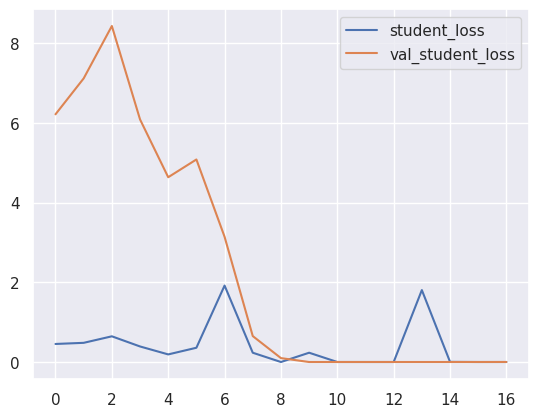

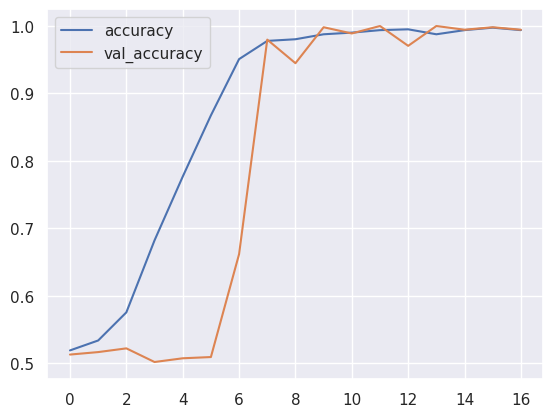

In [ ]:
distiller_history = pd.DataFrame(distillation_history.history)
distiller_history.loc[:, ['student_loss', 'val_student_loss']].plot()
distiller_history.loc[:, ['accuracy', 'val_accuracy']].plot()

In [ ]:
print('Accuracy for Train: {:.4f}'.format(distiller_history['accuracy'].mean()))
print('Loss for Train: {:.4f}'.format(distiller_history['student_loss'].mean()))
print('Accuracy for Test: {:.4f}'.format(distiller_history['val_accuracy'].mean()))
print('Loss for Test: {:.4f}'.format(distiller_history['val_student_loss'].mean()))

Accuracy for Train: 0.8708
Loss for Train: 0.3947
Accuracy for Test: 0.8001
Loss for Test: 2.4395


In [ ]:
start_dist = time.time()
predict_labels_dist = distillation_.predict(true_images)
duration_dist = time.time() - start_dist

loss_object = SparseCategoricalCrossentropy(from_logits=True)
true_labels_dist = tf.reshape(true_labels, (-1,))
loss_dist = loss_object(true_labels_dist,predict_labels_dist)

predict_labels_distiller = np.argmax(distillation_.predict(true_images), axis=1)

print("Accuracy: {:0.4f}".format(accuracy_score(true_labels, predict_labels_distiller)))
print("Loss: {:0.4f}".format(loss_dist))
print("Inference Time: {:.2f}s".format(duration_dist))
print("Precision: {:0.4f}".format(precision_score(true_labels, predict_labels_distiller)))
print("Recall: {:0.4f}".format(recall_score(true_labels, predict_labels_distiller)))
print("F1-Score: {:0.4f}".format(f1_score(true_labels, predict_labels_distiller)))
print("AUC: {:0.4f}".format(roc_auc_score(true_labels, predict_labels_distiller)))
print("MCC: {:0.4f}".format(matthews_corrcoef(true_labels, predict_labels_distiller)))

Accuracy: 1.0000
Loss: 0.0004
Inference Time: 1.30s
Precision: 1.0000
Recall: 1.0000
F1-Score: 1.0000
AUC: 1.0000
MCC: 1.0000


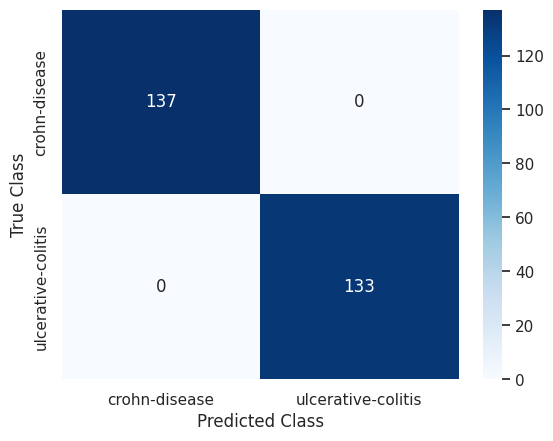

In [ ]:
conf_matrix_distiller = pd.DataFrame(confusion_matrix(true_labels, predict_labels_distiller), columns=['crohn-disease', 'ulcerative-colitis'], index=['crohn-disease', 'ulcerative-colitis'])
ax = sns.heatmap(conf_matrix_distiller, annot=True, fmt='', cmap='Blues')
ax.set(xlabel='Predicted Class', ylabel='True Class')
plt.show()

In [ ]:
for _images, ax in zip(image_interpretability_3, axis.flat):
  img_array = read_and_transform_img(_images)

  preds_dist = distillation_.predict(img_array)
  if np.argmax(preds_dist, axis=1) == 0: print('crohn-disease')
  else: print('ulcerative-colitis')

ulcerative-colitis
ulcerative-colitis
ulcerative-colitis
crohn-disease
crohn-disease
crohn-disease


<h1>Interpretability of Teacher</h1>

<h3>Grad-Cam</h3>

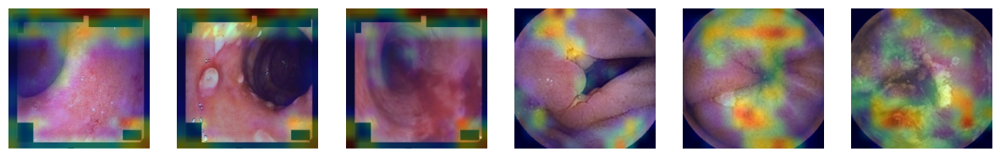

In [ ]:
last_conv_layer_name = "block5_conv3"

fig, axis = plt.subplots(1, 6, figsize=(15, 15))
for _images, ax in zip(image_interpretability_3, axis.flat):
  img_array = read_and_transform_img(_images)

  model_vgg16.layers[-1].activation = None

  preds = model_vgg16.predict(img_array)
  heatmap = make_gradcam_heatmap_CNN(img_array, model_vgg16, last_conv_layer_name)

  heatmap = np.reshape(heatmap, (-1,14))
  display_gradcam(_images, heatmap, preds=preds[0], plot=ax)

<h3>LIME</h3>

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

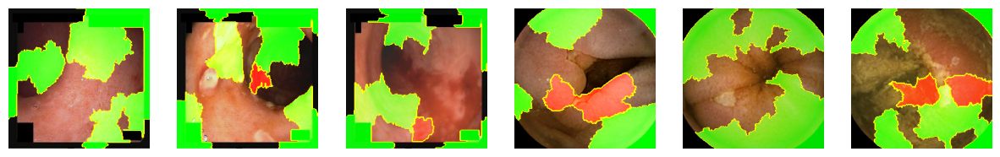

In [ ]:
explainer = lime_image.LimeImageExplainer()

fig, axis = plt.subplots(1, 6, figsize=(15, 15))
for _images, ax in zip(image_interpretability_3, axis.flat):
  img_array = read_and_transform_img(_images)
    
  explanation = explainer.explain_instance(img_array[0].astype(np.uint8), model_vgg16.predict, hide_color=0, num_samples=1000)
  temp_, mask_ = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=False, num_features=10, hide_rest=False)

  ax.imshow(mark_boundaries(temp_, mask_))
  ax.axis('off')

<h3>Shapley Values</h3>

`tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.


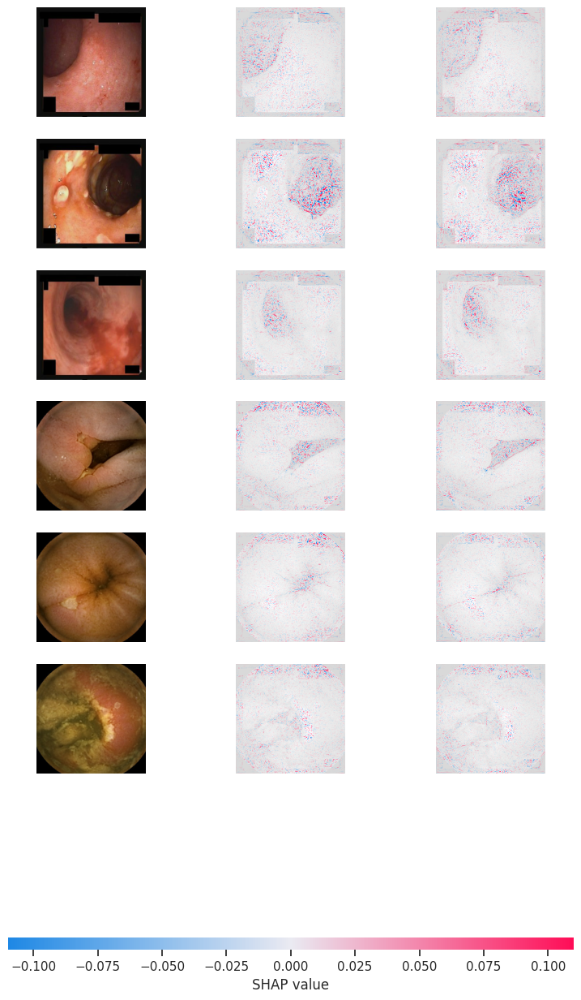

In [ ]:
images_train, labels_train = tuple(zip(*train_ds))
images_train_1 = np.concatenate(images_train)

shap_values = shap.GradientExplainer(model_vgg16, images_train_1).shap_values(image_interpretability_3)
shap.image_plot(shap_values, image_interpretability_3)

<h3>RISE (Randomized Image Sampling for Explanations)</h3>

In [ ]:
model_rise = RISE(1000, 8, 0.5, model_vgg16, batch_size,IMG_SIZE)
masks = model_rise.generate_masks()

Generating masks: 100%|██████████| 1000/1000 [00:02<00:00, 471.19it/s]


Explaining: 100%|██████████| 32/32 [00:06<00:00,  4.83it/s]


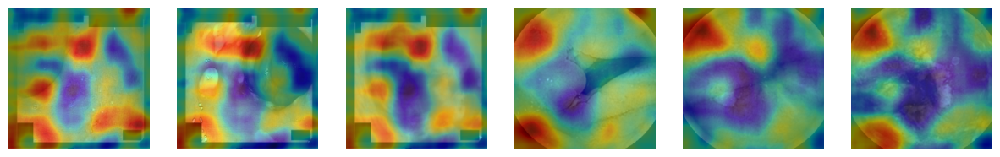

In [ ]:
idx = 0
fig, axis = plt.subplots(1, 6, figsize=(15, 15))
for _images, ax in zip(image_interpretability_3, axis.flat):
  img_array = read_and_transform_img(_images)

  sal = model_rise.explain(img_array, masks)

  ax.imshow(_images.astype(np.uint8))
  ax.imshow(sal[int(labels_interpretability_3[idx])], cmap='jet', alpha=0.5)
  ax.axis('off')

  idx += 1

<h3>Occlusion Sensitivity</h3>

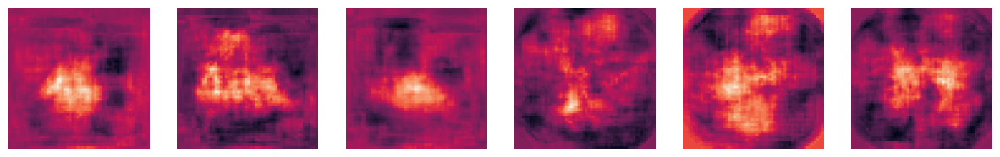

In [ ]:
idx = 0

fig, axis = plt.subplots(1, 6, figsize=(15, 15))
for _images, ax in zip(image_interpretability_3, axis.flat):
  occ = OcclusionMaps(_images)
  heatmap = occ.get_heatmap(model_vgg16, 4, int(labels_interpretability_3[idx]), IMG_SIZE[0])

  ax.imshow(heatmap)
  ax.axis('off')

  idx += 1

<h1>Interpretability of Student</h1>

<h3>LIME</h3>

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

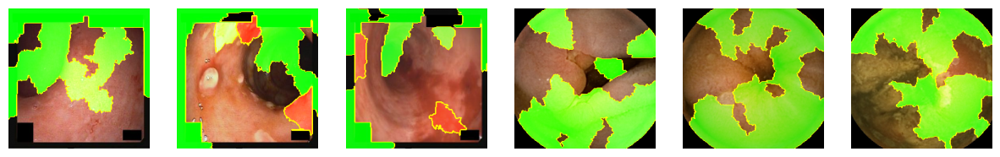

In [ ]:
explainer = lime_image.LimeImageExplainer()

fig, axis = plt.subplots(1, 6, figsize=(15, 15))
for _images, ax in zip(image_interpretability_3, axis.flat):
  img_array = read_and_transform_img(_images)
    
  explanation = explainer.explain_instance(img_array[0].astype(np.uint8), distillation_.predict, hide_color=0, num_samples=1000)
  temp_, mask_ = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=False, num_features=10, hide_rest=False)

  ax.imshow(mark_boundaries(temp_, mask_))
  ax.axis('off')

<h3>RISE (Randomized Image Sampling for Explanations)</h3>

In [ ]:
model_rise = RISE(1000, 8, 0.5, distillation_, batch_size,IMG_SIZE)
masks = model_rise.generate_masks()

Generating masks: 100%|██████████| 1000/1000 [00:02<00:00, 426.04it/s]


Explaining: 100%|██████████| 32/32 [00:02<00:00, 11.98it/s]


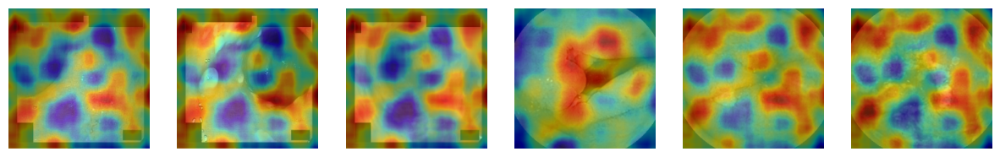

In [ ]:
idx = 0
fig, axis = plt.subplots(1, 6, figsize=(15, 15))
for _images, ax in zip(image_interpretability_3, axis.flat):
  img_array = read_and_transform_img(_images)

  sal = model_rise.explain(img_array, masks)

  ax.imshow(_images.astype(np.uint8))
  ax.imshow(sal[int(labels_interpretability_3[idx])], cmap='jet', alpha=0.5)
  ax.axis('off')

  idx += 1

<h3>Occlusion Sensitivity</h3>

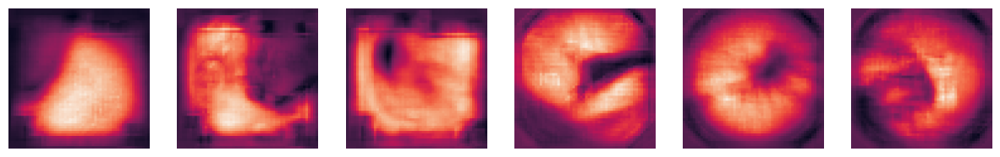

In [ ]:
idx = 0

fig, axis = plt.subplots(1, 6, figsize=(15, 15))
for _images, ax in zip(image_interpretability_3, axis.flat):
  occ = OcclusionMaps(_images)
  heatmap = occ.get_heatmap(distillation_, 4, int(labels_interpretability_3[idx]), IMG_SIZE[0])

  ax.imshow(heatmap)
  ax.axis('off')

  idx += 1

# InceptionV3

In [ ]:
inputs = Input(shape=(224,224,3))
x = data_augmentation(inputs)
x = preprocess_input_inceptionV3(x)
x = InceptionV3(weights='imagenet', pooling='avg', include_top=False, input_tensor=x)
outputs = layers.Dense(len(class_names))(x.output)
model_inceptionV3 = Model(inputs, outputs)

87924736/87910968 [==============================] - 0s 0us/step


In [ ]:
model_inceptionV3.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 sequential (Sequential)        (None, 224, 224, 3)  0           ['input_2[0][0]']                
                                                                                                  
 tf.math.truediv (TFOpLambda)   (None, 224, 224, 3)  0           ['sequential[1][0]']             
                                                                                                  
 tf.math.subtract (TFOpLambda)  (None, 224, 224, 3)  0           ['tf.math.truediv[0][0]']  

In [ ]:
model_inceptionV3.compile(loss=SparseCategoricalCrossentropy(from_logits=True), optimizer=Adam(learning_rate=1e-5), metrics=['accuracy'])

In [ ]:
history_inceptionV3 = model_inceptionV3.fit(train_ds, epochs=200, validation_data=test_ds, callbacks=[early_stopping])

Epoch 1/200
26/26 [==============================] - 22s 423ms/step - loss: 0.4319 - accuracy: 0.8405 - val_loss: 0.3181 - val_accuracy: 0.8897
Epoch 2/200
26/26 [==============================] - 8s 295ms/step - loss: 0.1592 - accuracy: 0.9767 - val_loss: 0.1391 - val_accuracy: 0.9816
Epoch 3/200
26/26 [==============================] - 8s 294ms/step - loss: 0.0921 - accuracy: 0.9877 - val_loss: 0.0673 - val_accuracy: 0.9890
Epoch 4/200
26/26 [==============================] - 8s 299ms/step - loss: 0.0579 - accuracy: 0.9890 - val_loss: 0.0456 - val_accuracy: 0.9926
Epoch 5/200
26/26 [==============================] - 8s 304ms/step - loss: 0.0341 - accuracy: 0.9963 - val_loss: 0.0368 - val_accuracy: 0.9945
Epoch 6/200
26/26 [==============================] - 8s 306ms/step - loss: 0.0342 - accuracy: 0.9914 - val_loss: 0.0269 - val_accuracy: 0.9963
Epoch 7/200
26/26 [==============================] - 8s 310ms/step - loss: 0.0254 - accuracy: 0.9939 - val_loss: 0.0177 - val_accuracy: 1.000

<Axes: >

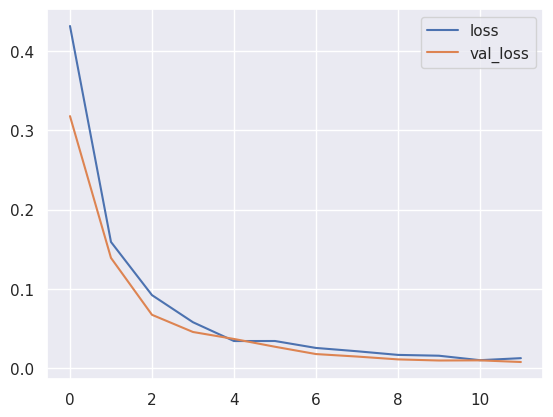

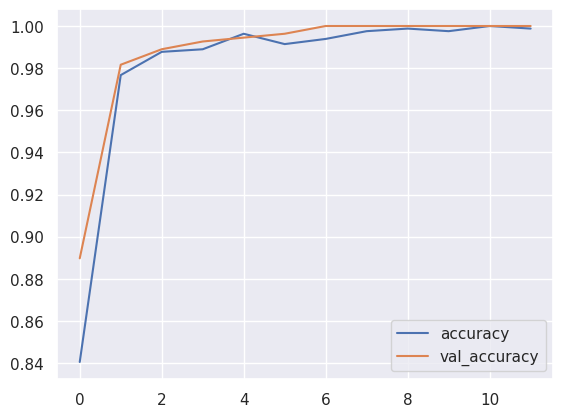

In [ ]:
model_history_inceptionV3 = pd.DataFrame(history_inceptionV3.history)
model_history_inceptionV3.loc[:, ['loss', 'val_loss']].plot()
model_history_inceptionV3.loc[:, ['accuracy', 'val_accuracy']].plot()

In [ ]:
print('Accuracy for Train: {:.4f}'.format(model_history_inceptionV3['accuracy'].mean()))
print('Loss for Train: {:.4f}'.format(model_history_inceptionV3['loss'].mean()))
print('Accuracy for Test: {:.4f}'.format(model_history_inceptionV3['val_accuracy'].mean()))
print('Loss for Test: {:.4f}'.format(model_history_inceptionV3['val_loss'].mean()))

Accuracy for Train: 0.9807
Loss for Train: 0.0759
Accuracy for Test: 0.9870
Loss for Test: 0.0587


In [ ]:
start = time.time()
predict_labels_ = model_inceptionV3.predict(true_images)
duration = time.time() - start

loss_object = SparseCategoricalCrossentropy(from_logits=True)
true_labels_1 = tf.reshape(true_labels, (-1,))
loss = loss_object(true_labels_1,predict_labels_)

predict_labels_inceptionV3 = np.argmax(model_inceptionV3.predict(true_images), axis=1)

print("Accuracy: {:0.4f}".format(accuracy_score(true_labels, predict_labels_inceptionV3)))
print("Loss: {:0.4f}".format(loss))
print("Inference Time: {:.2f}s".format(duration))
print("Precision: {:0.4f}".format(precision_score(true_labels, predict_labels_inceptionV3)))
print("Recall: {:0.4f}".format(recall_score(true_labels, predict_labels_inceptionV3)))
print("F1-Score: {:0.4f}".format(f1_score(true_labels, predict_labels_inceptionV3)))
print("AUC: {:0.4f}".format(roc_auc_score(true_labels, predict_labels_inceptionV3)))
print("MCC: {:0.4f}".format(matthews_corrcoef(true_labels, predict_labels_inceptionV3)))

Accuracy: 1.0000
Loss: 0.0067
Inference Time: 2.94s
Precision: 1.0000
Recall: 1.0000
F1-Score: 1.0000
AUC: 1.0000
MCC: 1.0000


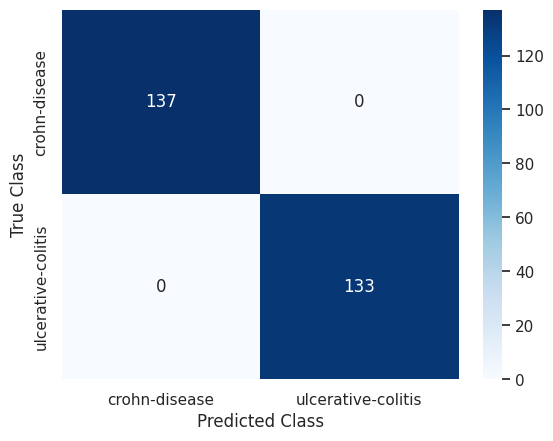

In [ ]:
conf_matrix_inceptionV3 = pd.DataFrame(confusion_matrix(true_labels, predict_labels_inceptionV3), columns=['crohn-disease', 'ulcerative-colitis'], index=['crohn-disease', 'ulcerative-colitis'])
ax = sns.heatmap(conf_matrix_inceptionV3, annot=True, fmt='', cmap='Blues')
ax.set(xlabel='Predicted Class', ylabel='True Class')
plt.show()

In [ ]:
for _images, ax in zip(image_interpretability_3, axis.flat):
  img_array = read_and_transform_img(_images)

  preds = model_inceptionV3.predict(img_array)
  if np.argmax(preds, axis=1) == 0: print('crohn-disease')
  else: print('ulcerative-colitis')

crohn-disease
crohn-disease
ulcerative-colitis
crohn-disease
ulcerative-colitis
ulcerative-colitis


<h1>Knowledge Distillation</h1>

In [ ]:
distillation_CNN = Distiller(student=student_model, teacher=model_inceptionV3)

distillation_CNN.compile(
    optimizer=Adam(learning_rate=1e-4),
    metrics=['accuracy'],
    student_loss_fn=SparseCategoricalCrossentropy(from_logits=True), 
    distillation_loss_fn=KLDivergence(),
    alpha=0.8,
    temperature=105)

In [ ]:
distillation_history_CNN = distillation_CNN.fit(train_ds, epochs=100, validation_data=test_ds, callbacks=[early_stopping])

Epoch 1/100
26/26 [==============================] - 15s 340ms/step - accuracy: 0.5669 - student_loss: 0.6839 - distillation_loss: 5.4269 - val_accuracy: 0.5147 - val_student_loss: 0.7032
Epoch 2/100
26/26 [==============================] - 7s 261ms/step - accuracy: 0.7718 - student_loss: 0.4802 - distillation_loss: 4.1334 - val_accuracy: 0.5129 - val_student_loss: 1.5851
Epoch 3/100
26/26 [==============================] - 7s 263ms/step - accuracy: 0.9153 - student_loss: 0.2366 - distillation_loss: 2.4698 - val_accuracy: 0.5055 - val_student_loss: 1.6920
Epoch 4/100
26/26 [==============================] - 7s 265ms/step - accuracy: 0.9521 - student_loss: 0.1338 - distillation_loss: 1.7753 - val_accuracy: 0.5092 - val_student_loss: 1.1646
Epoch 5/100
26/26 [==============================] - 7s 263ms/step - accuracy: 0.9853 - student_loss: 0.0735 - distillation_loss: 1.5724 - val_accuracy: 0.5000 - val_student_loss: 1.0404
Epoch 6/100
26/26 [==============================] - 7s 261ms/st

<Axes: >

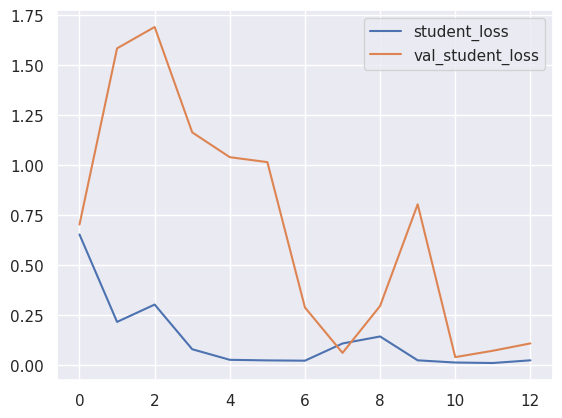

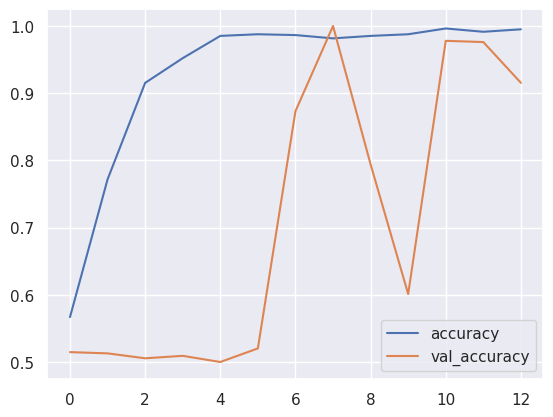

In [ ]:
distiller_history = pd.DataFrame(distillation_history_CNN.history)
distiller_history.loc[:, ['student_loss', 'val_student_loss']].plot()
distiller_history.loc[:, ['accuracy', 'val_accuracy']].plot()

In [ ]:
print('Accuracy for Train: {:.4f}'.format(distiller_history['accuracy'].mean()))
print('Loss for Train: {:.4f}'.format(distiller_history['student_loss'].mean()))
print('Accuracy for Test: {:.4f}'.format(distiller_history['val_accuracy'].mean()))
print('Loss for Test: {:.4f}'.format(distiller_history['val_student_loss'].mean()))

Accuracy for Train: 0.9310
Loss for Train: 0.1264
Accuracy for Test: 0.7077
Loss for Test: 0.6823


In [ ]:
start_dist = time.time()
predict_labels_dist = distillation_CNN.predict(true_images)
duration_dist = time.time() - start_dist

loss_object = SparseCategoricalCrossentropy(from_logits=True)
true_labels_dist = tf.reshape(true_labels, (-1,))
loss_dist = loss_object(true_labels_dist,predict_labels_dist)

predict_labels_distiller = np.argmax(distillation_CNN.predict(true_images), axis=1)

print("Accuracy: {:0.4f}".format(accuracy_score(true_labels, predict_labels_distiller)))
print("Loss: {:0.4f}".format(loss_dist))
print("Inference Time: {:.2f}s".format(duration_dist))
print("Precision: {:0.4f}".format(precision_score(true_labels, predict_labels_distiller)))
print("Recall: {:0.4f}".format(recall_score(true_labels, predict_labels_distiller)))
print("F1-Score: {:0.4f}".format(f1_score(true_labels, predict_labels_distiller)))
print("AUC: {:0.4f}".format(roc_auc_score(true_labels, predict_labels_distiller)))
print("MCC: {:0.4f}".format(matthews_corrcoef(true_labels, predict_labels_distiller)))

Accuracy: 0.9185
Loss: 0.2287
Inference Time: 1.28s
Precision: 0.8581
Recall: 1.0000
F1-Score: 0.9236
AUC: 0.9197
MCC: 0.8487


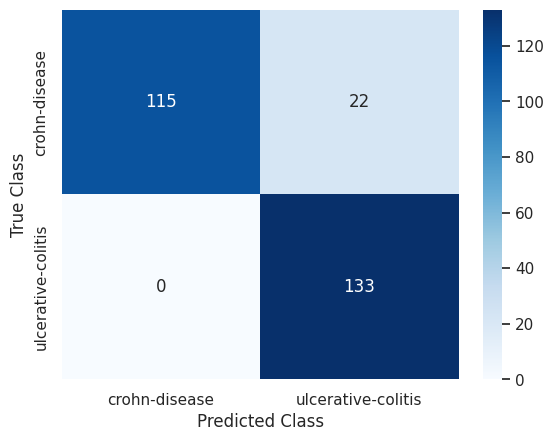

In [ ]:
conf_matrix_distiller = pd.DataFrame(confusion_matrix(true_labels, predict_labels_distiller), columns=['crohn-disease', 'ulcerative-colitis'], index=['crohn-disease', 'ulcerative-colitis'])
ax = sns.heatmap(conf_matrix_distiller, annot=True, fmt='', cmap='Blues')
ax.set(xlabel='Predicted Class', ylabel='True Class')
plt.show()

In [ ]:
for _images, ax in zip(image_interpretability_3, axis.flat):
  img_array = read_and_transform_img(_images)

  preds_dist = distillation_CNN.predict(img_array)
  if np.argmax(preds_dist, axis=1) == 0: print('crohn-disease')
  else: print('ulcerative-colitis')

crohn-disease
ulcerative-colitis
ulcerative-colitis
crohn-disease
ulcerative-colitis
ulcerative-colitis


<h1>Interpretability of Teacher</h1>

<h3>Grad-Cam</h3>

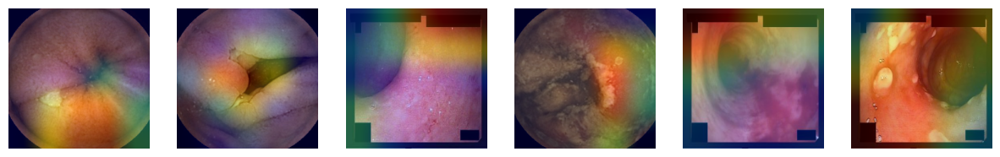

In [ ]:
last_conv_layer_name = "conv2d_101"

fig, axis = plt.subplots(1, 6, figsize=(15, 15))
for _images, ax in zip(image_interpretability_3, axis.flat):
  img_array = read_and_transform_img(_images)

  model_inceptionV3.layers[-1].activation = None

  preds = model_inceptionV3.predict(img_array)
  heatmap = make_gradcam_heatmap_CNN(img_array, model_inceptionV3, last_conv_layer_name)

  heatmap = np.reshape(heatmap, (-1,5))
  display_gradcam(_images, heatmap, preds=preds[0], plot=ax)

<h3>LIME</h3>

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

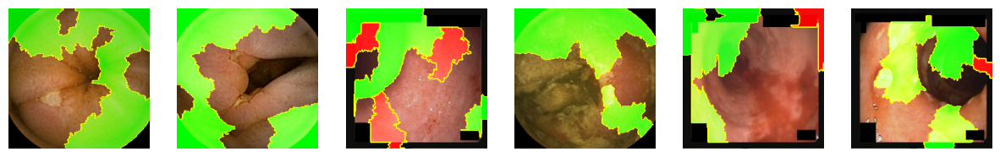

In [ ]:
explainer = lime_image.LimeImageExplainer()

fig, axis = plt.subplots(1, 6, figsize=(15, 15))
for _images, ax in zip(image_interpretability_3, axis.flat):
  img_array = read_and_transform_img(_images)
    
  explanation = explainer.explain_instance(img_array[0].astype(np.uint8), model_inceptionV3.predict, hide_color=0, num_samples=1000)
  temp_, mask_ = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=False, num_features=10, hide_rest=False)

  ax.imshow(mark_boundaries(temp_, mask_))
  ax.axis('off')

<h3>Shapley Values</h3>

`tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.


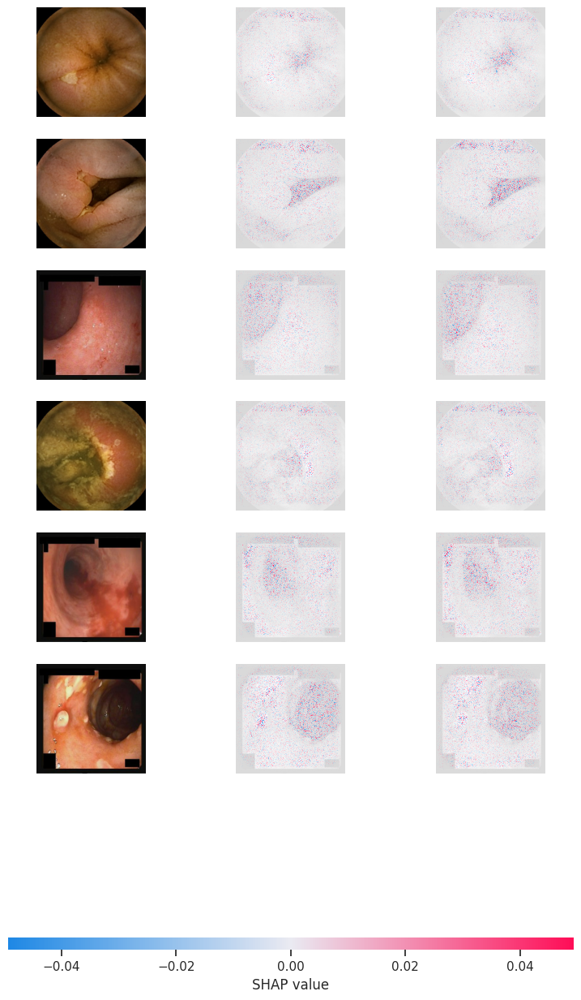

In [ ]:
images_train, labels_train = tuple(zip(*train_ds))
images_train_1 = np.concatenate(images_train)

shap_values = shap.GradientExplainer(model_inceptionV3, images_train_1).shap_values(image_interpretability_3)
shap.image_plot(shap_values, image_interpretability_3)

<h3>RISE (Randomized Image Sampling for Explanations)</h3>

In [ ]:
model_rise = RISE(1000, 8, 0.5, model_inceptionV3, batch_size,IMG_SIZE)
masks = model_rise.generate_masks()

Generating masks: 100%|██████████| 1000/1000 [00:02<00:00, 444.96it/s]


Explaining: 100%|██████████| 32/32 [00:03<00:00,  8.83it/s]


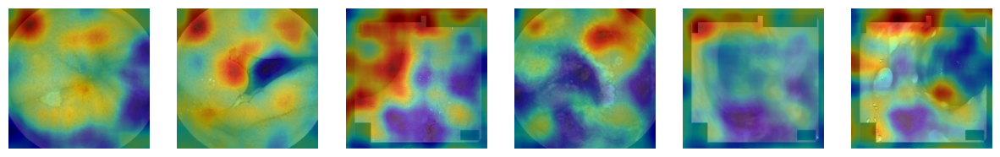

In [ ]:
idx = 0
fig, axis = plt.subplots(1, 6, figsize=(15, 15))
for _images, ax in zip(image_interpretability_3, axis.flat):
  img_array = read_and_transform_img(_images)

  sal = model_rise.explain(img_array, masks)

  ax.imshow(_images.astype(np.uint8))
  ax.imshow(sal[int(labels_interpretability_3[idx])], cmap='jet', alpha=0.5)
  ax.axis('off')

  idx += 1

<h3>Occlusion Sensitivity</h3>

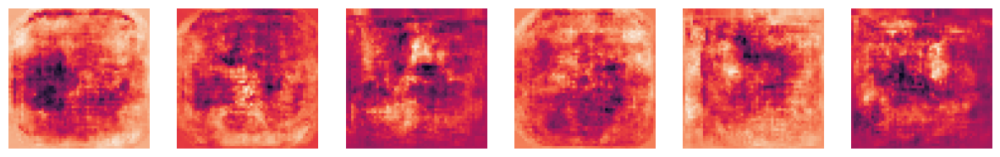

In [ ]:
idx = 0

fig, axis = plt.subplots(1, 6, figsize=(15, 15))
for _images, ax in zip(image_interpretability_3, axis.flat):
  img_array = read_and_transform_img(_images)

  occ = OcclusionMaps(_images)
  heatmap = occ.get_heatmap(model_inceptionV3, 4, int(labels_interpretability_3[idx]), IMG_SIZE[0])

  ax.imshow(heatmap)
  ax.axis('off')

  idx += 1

<h1>Interpretability of Student</h1>

<h3>LIME</h3>

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

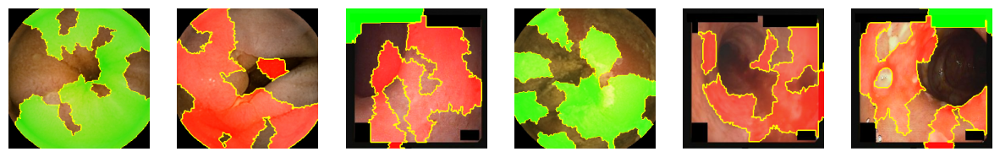

In [ ]:
explainer = lime_image.LimeImageExplainer()

fig, axis = plt.subplots(1, 6, figsize=(15, 15))
for _images, ax in zip(image_interpretability_3, axis.flat):
  img_array = read_and_transform_img(_images)
    
  explanation = explainer.explain_instance(img_array[0].astype(np.uint8), distillation_CNN.predict, hide_color=0, num_samples=1000)
  temp_, mask_ = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=False, num_features=10, hide_rest=False)

  ax.imshow(mark_boundaries(temp_, mask_))
  ax.axis('off')

<h3>RISE (Randomized Image Sampling for Explanations)</h3>

In [ ]:
model_rise = RISE(1000, 8, 0.5, distillation_CNN, batch_size,IMG_SIZE)
masks = model_rise.generate_masks()

Generating masks: 100%|██████████| 1000/1000 [00:02<00:00, 450.55it/s]


Explaining: 100%|██████████| 32/32 [00:02<00:00, 11.05it/s]


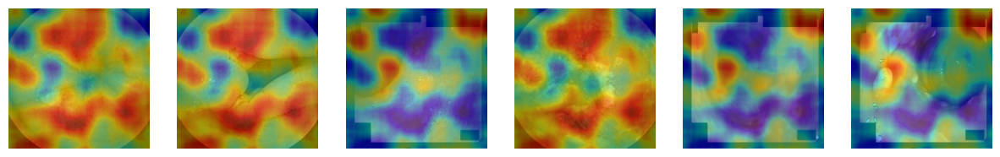

In [ ]:
idx = 0
fig, axis = plt.subplots(1, 6, figsize=(15, 15))
for _images, ax in zip(image_interpretability_3, axis.flat):
  img_array = read_and_transform_img(_images)

  sal = model_rise.explain(img_array, masks)

  ax.imshow(_images.astype(np.uint8))
  ax.imshow(sal[int(labels_interpretability_3[idx])], cmap='jet', alpha=0.5)
  ax.axis('off')

  idx += 1

<h3>Occlusion Maps</h3>

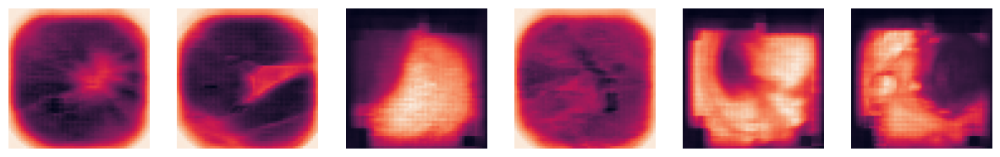

In [ ]:
idx = 0

fig, axis = plt.subplots(1, 6, figsize=(15, 15))
for _images, ax in zip(image_interpretability_3, axis.flat):
  occ = OcclusionMaps(_images)
  heatmap = occ.get_heatmap(distillation_CNN, 4, int(labels_interpretability_3[idx]), IMG_SIZE[0])

  ax.imshow(heatmap)
  ax.axis('off')

  idx += 1

# Resnet50+MobileNetV2

In [ ]:
inputs_model = Input(shape=(224, 224, 3))
aug = data_augmentation(inputs_model)

preprocess_res = preprocess_input_resnet(aug)
outputs_model_1 = ResNet50(weights='imagenet', include_top=False, pooling='avg', input_tensor=preprocess_res)

preprocess_mobile = preprocess_input_mobilenet(aug)
outputs_model_2 = MobileNetV2(weights='imagenet', include_top=False, pooling='avg', input_tensor=preprocess_mobile)

merged_l = layers.Concatenate()([outputs_model_1.output,outputs_model_2.output])
output_layer = layers.Dense(2)(merged_l)

ensemble_method = Model(inputs=inputs_model,outputs=output_layer)

9420800/9406464 [==============================] - 0s 0us/step


In [ ]:
ensemble_method.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 sequential (Sequential)        (None, 224, 224, 3)  0           ['input_2[0][0]']                
                                                                                                  
 tf.__operators__.getitem (Slic  (None, 224, 224, 3)  0          ['sequential[1][0]']             
 ingOpLambda)                                                                                     
                                                                                            

In [ ]:
utils.plot_model(ensemble_method, show_shapes=True)

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
ensemble_method.compile(loss=SparseCategoricalCrossentropy(from_logits=True), optimizer=Adam(learning_rate=1e-5), metrics=['accuracy'])

In [ ]:
history_2 = ensemble_method.fit(train_ds, epochs=200, validation_data=test_ds, callbacks=[early_stopping])

Epoch 1/200
26/26 [==============================] - 34s 756ms/step - loss: 0.5223 - accuracy: 0.7423 - val_loss: 0.3590 - val_accuracy: 0.7941
Epoch 2/200
26/26 [==============================] - 17s 635ms/step - loss: 0.0703 - accuracy: 0.9963 - val_loss: 0.1472 - val_accuracy: 0.9596
Epoch 3/200
26/26 [==============================] - 17s 644ms/step - loss: 0.0308 - accuracy: 0.9975 - val_loss: 0.0926 - val_accuracy: 0.9945
Epoch 4/200
26/26 [==============================] - 16s 633ms/step - loss: 0.0202 - accuracy: 0.9988 - val_loss: 0.0562 - val_accuracy: 1.0000
Epoch 5/200
26/26 [==============================] - 16s 625ms/step - loss: 0.0129 - accuracy: 1.0000 - val_loss: 0.0411 - val_accuracy: 1.0000
Epoch 6/200
26/26 [==============================] - 16s 622ms/step - loss: 0.0140 - accuracy: 0.9975 - val_loss: 0.0269 - val_accuracy: 1.0000
Epoch 7/200
26/26 [==============================] - 16s 626ms/step - loss: 0.0077 - accuracy: 1.0000 - val_loss: 0.0202 - val_accuracy:

<Axes: >

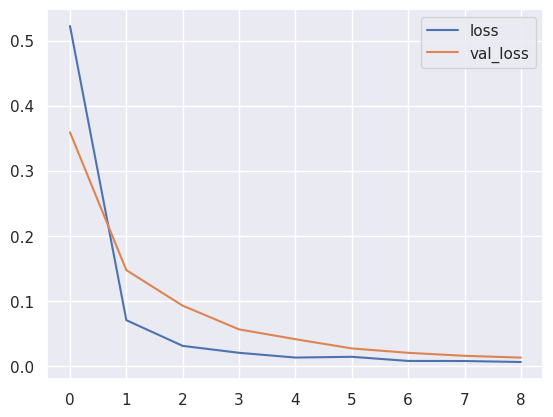

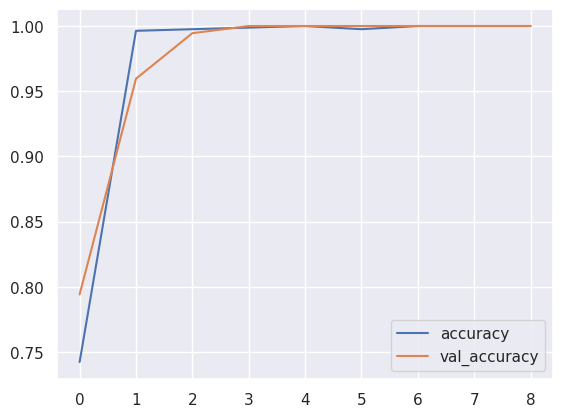

In [ ]:
model_history_2 = pd.DataFrame(history_2.history)
model_history_2.loc[:, ['loss', 'val_loss']].plot()
model_history_2.loc[:, ['accuracy', 'val_accuracy']].plot()

In [ ]:
print('Accuracy for Train: {:.4f}'.format(model_history_2['accuracy'].mean()))
print('Loss for Train: {:.4f}'.format(model_history_2['loss'].mean()))
print('Accuracy for Test: {:.4f}'.format(model_history_2['val_accuracy'].mean()))
print('Loss for Test: {:.4f}'.format(model_history_2['val_loss'].mean()))

Accuracy for Train: 0.9703
Loss for Train: 0.0769
Accuracy for Test: 0.9720
Loss for Test: 0.0857


In [ ]:
start = time.time()
predict_labels_ = ensemble_method.predict(true_images)
duration = time.time() - start

loss_object = SparseCategoricalCrossentropy(from_logits=True)
true_labels_1 = tf.reshape(true_labels, (-1,))
loss = loss_object(true_labels_1,predict_labels_)

predict_labels_2 = np.argmax(ensemble_method.predict(true_images), axis=1)

print("Accuracy: {:0.4f}".format(accuracy_score(true_labels, predict_labels_2)))
print("Loss: {:0.4f}".format(loss))
print("Inference Time: {:.2f}s".format(duration))
print("Precision: {:0.4f}".format(precision_score(true_labels, predict_labels_2)))
print("Recall: {:0.4f}".format(recall_score(true_labels, predict_labels_2)))
print("F1-Score: {:0.4f}".format(f1_score(true_labels, predict_labels_2)))
print("AUC: {:0.4f}".format(roc_auc_score(true_labels, predict_labels_2)))
print("MCC: {:0.4f}".format(matthews_corrcoef(true_labels, predict_labels_2)))

Accuracy: 1.0000
Loss: 0.0121
Inference Time: 3.68s
Precision: 1.0000
Recall: 1.0000
F1-Score: 1.0000
AUC: 1.0000
MCC: 1.0000


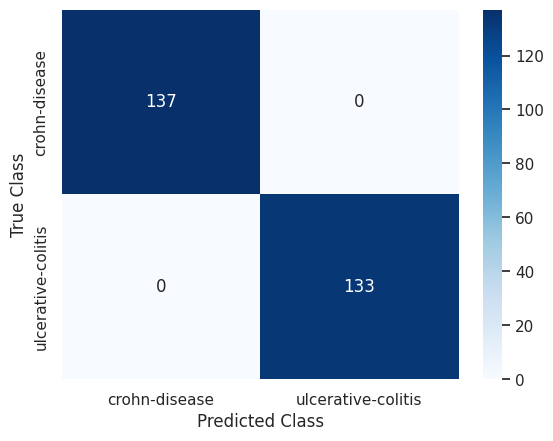

In [ ]:
conf_matrix_2 = pd.DataFrame(confusion_matrix(true_labels, predict_labels_2), columns=['crohn-disease', 'ulcerative-colitis'], index=['crohn-disease', 'ulcerative-colitis'])
ax = sns.heatmap(conf_matrix_2, annot=True, fmt='', cmap='Blues')
ax.set(xlabel='Predicted Class', ylabel='True Class')
plt.show()

In [ ]:
for _images, ax in zip(image_interpretability_3, axis.flat):
  img_array = read_and_transform_img(_images)

  preds = ensemble_method.predict(img_array)
  if np.argmax(preds, axis=1) == 0: print('crohn-disease')
  else: print('ulcerative-colitis')

ulcerative-colitis
ulcerative-colitis
crohn-disease
crohn-disease
crohn-disease
ulcerative-colitis


<h1>Knowledge Distillation</h1>

In [ ]:
distillation_ = Distiller(student=student_model, teacher=ensemble_method)

distillation_.compile(
    optimizer=Adam(learning_rate=1e-4),
    metrics=['accuracy'],
    student_loss_fn=SparseCategoricalCrossentropy(from_logits=True), 
    distillation_loss_fn=KLDivergence(),
    alpha=0.8,
    temperature=105)

In [ ]:
distillation_history = distillation_.fit(train_ds, epochs=100, validation_data=test_ds, callbacks=[early_stopping])

Epoch 1/100
26/26 [==============================] - 16s 383ms/step - accuracy: 0.6160 - student_loss: 0.6819 - distillation_loss: 8.1420 - val_accuracy: 0.5221 - val_student_loss: 0.7079
Epoch 2/100
26/26 [==============================] - 8s 309ms/step - accuracy: 0.8589 - student_loss: 0.4263 - distillation_loss: 6.3962 - val_accuracy: 0.5018 - val_student_loss: 2.1649
Epoch 3/100
26/26 [==============================] - 8s 312ms/step - accuracy: 0.9436 - student_loss: 0.1840 - distillation_loss: 2.9628 - val_accuracy: 0.5074 - val_student_loss: 2.3732
Epoch 4/100
26/26 [==============================] - 8s 308ms/step - accuracy: 0.9791 - student_loss: 0.0938 - distillation_loss: 2.0638 - val_accuracy: 0.5092 - val_student_loss: 3.0406
Epoch 5/100
26/26 [==============================] - 8s 310ms/step - accuracy: 0.9755 - student_loss: 0.1155 - distillation_loss: 2.0983 - val_accuracy: 0.5129 - val_student_loss: 2.7604
Epoch 6/100
26/26 [==============================] - 8s 308ms/st

<Axes: >

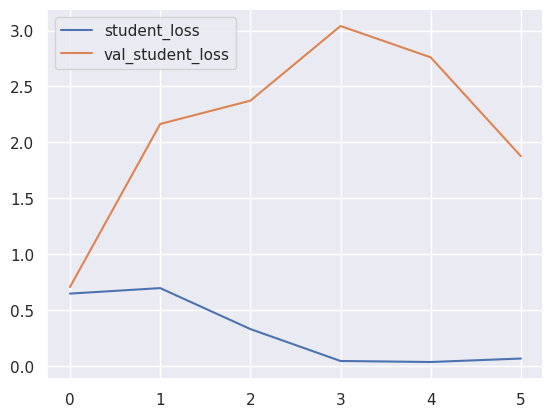

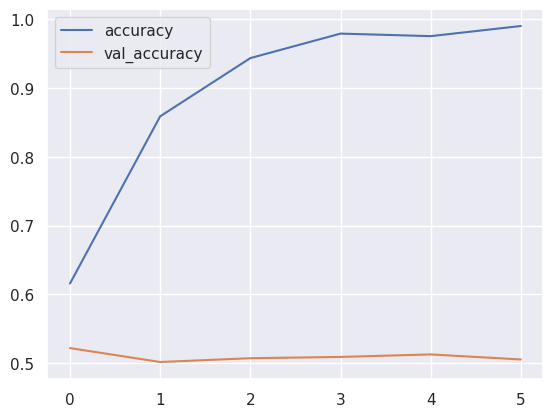

In [ ]:
distiller_history = pd.DataFrame(distillation_history.history)
distiller_history.loc[:, ['student_loss', 'val_student_loss']].plot()
distiller_history.loc[:, ['accuracy', 'val_accuracy']].plot()

In [ ]:
print('Accuracy for Train: {:.4f}'.format(distiller_history['accuracy'].mean()))
print('Loss for Train: {:.4f}'.format(distiller_history['student_loss'].mean()))
print('Accuracy for Test: {:.4f}'.format(distiller_history['val_accuracy'].mean()))
print('Loss for Test: {:.4f}'.format(distiller_history['val_student_loss'].mean()))

Accuracy for Train: 0.8939
Loss for Train: 0.3055
Accuracy for Test: 0.5098
Loss for Test: 2.1540


In [ ]:
start_dist = time.time()
predict_labels_dist = distillation_.predict(true_images)
duration_dist = time.time() - start_dist

loss_object = SparseCategoricalCrossentropy(from_logits=True)
true_labels_dist = tf.reshape(true_labels, (-1,))
loss_dist = loss_object(true_labels_dist,predict_labels_dist)

predict_labels_distiller_2 = np.argmax(distillation_.predict(true_images), axis=1)

print("Accuracy: {:0.4f}".format(accuracy_score(true_labels, predict_labels_distiller_2)))
print("Loss: {:0.4f}".format(loss_dist))
print("Inference Time: {:.2f}s".format(duration_dist))
print("Precision: {:0.4f}".format(precision_score(true_labels, predict_labels_distiller_2)))
print("Recall: {:0.4f}".format(recall_score(true_labels, predict_labels_distiller_2)))
print("F1-Score: {:0.4f}".format(f1_score(true_labels, predict_labels_distiller_2)))
print("AUC: {:0.4f}".format(roc_auc_score(true_labels, predict_labels_distiller_2)))
print("MCC: {:0.4f}".format(matthews_corrcoef(true_labels, predict_labels_distiller_2)))

Accuracy: 0.4926
Loss: 1.2775
Inference Time: 1.39s
Precision: 0.4926
Recall: 1.0000
F1-Score: 0.6600
AUC: 0.5000
MCC: 0.0000


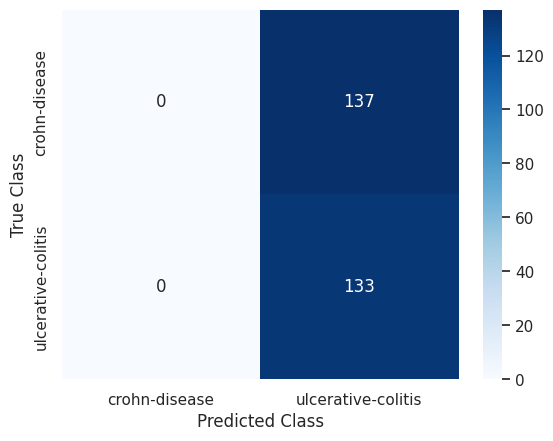

In [ ]:
conf_matrix_distiller = pd.DataFrame(confusion_matrix(true_labels, predict_labels_distiller_2), columns=['crohn-disease', 'ulcerative-colitis'], index=['crohn-disease', 'ulcerative-colitis'])
ax = sns.heatmap(conf_matrix_distiller, annot=True, fmt='', cmap='Blues')
ax.set(xlabel='Predicted Class', ylabel='True Class')
plt.show()

In [ ]:
for _images, ax in zip(image_interpretability_3, axis.flat):
  img_array = read_and_transform_img(_images)

  preds_dist = distillation_.predict(img_array)
  if np.argmax(preds_dist, axis=1) == 0: print('crohn-disease')
  else: print('ulcerative-colitis')

ulcerative-colitis
ulcerative-colitis
ulcerative-colitis
ulcerative-colitis
ulcerative-colitis
ulcerative-colitis


<h1>Interpretability of Teacher</h1>

<h3>Grad-Cam</h3>

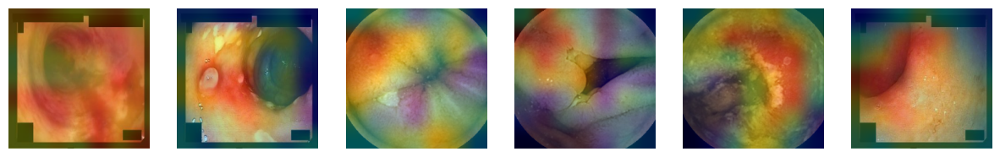

In [ ]:
last_conv_layer_name = "Conv_1"

fig, axis = plt.subplots(1, 6, figsize=(15, 15))
for _images, ax in zip(image_interpretability_3, axis.flat):
  img_array = read_and_transform_img(_images)

  ensemble_method.layers[-1].activation = None

  preds = ensemble_method.predict(img_array)
  heatmap = make_gradcam_heatmap_CNN(img_array, ensemble_method, last_conv_layer_name)

  heatmap = np.reshape(heatmap, (-1,7))
  display_gradcam(_images, heatmap, preds=preds[0], plot=ax)

<h3>LIME</h3>

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

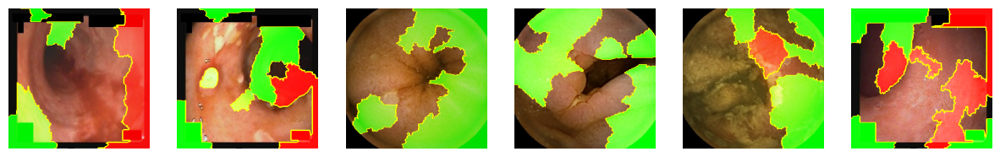

In [ ]:
explainer = lime_image.LimeImageExplainer()

fig, axis = plt.subplots(1, 6, figsize=(15, 15))
for _images, ax in zip(image_interpretability_3, axis.flat):
  img_array = read_and_transform_img(_images)
    
  explanation = explainer.explain_instance(img_array[0].astype(np.uint8), ensemble_method.predict, hide_color=0, num_samples=1000)
  temp_, mask_ = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=False, num_features=10, hide_rest=False)

  ax.imshow(mark_boundaries(temp_, mask_))
  ax.axis('off')

<h3>Shapley Values</h3>

`tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.


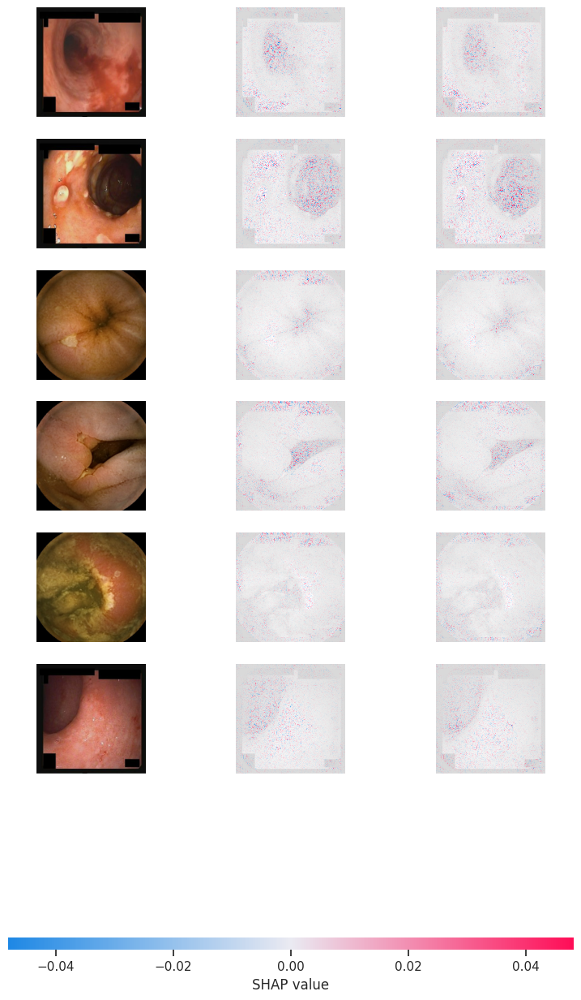

In [ ]:
images_train, labels_train = tuple(zip(*train_ds))
images_train_1 = np.concatenate(images_train)

shap_values = shap.GradientExplainer(ensemble_method, images_train_1).shap_values(image_interpretability_3)
shap.image_plot(shap_values, image_interpretability_3)

<h3>RISE (Randomized Image Sampling for Explanations)</h3>

In [ ]:
model_rise = RISE(1000, 8, 0.5, ensemble_method, batch_size,IMG_SIZE)
masks = model_rise.generate_masks()

Generating masks: 100%|██████████| 1000/1000 [00:02<00:00, 413.28it/s]


Explaining: 100%|██████████| 32/32 [00:05<00:00,  5.50it/s]


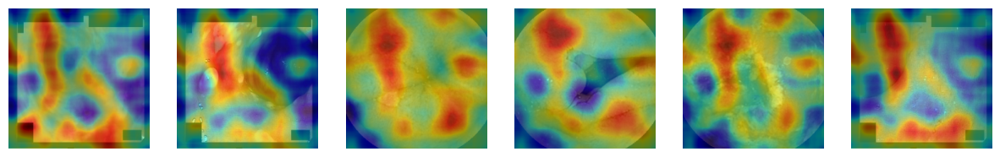

In [ ]:
idx = 0
fig, axis = plt.subplots(1, 6, figsize=(15, 15))
for _images, ax in zip(image_interpretability_3, axis.flat):
  img_array = read_and_transform_img(_images)

  sal = model_rise.explain(img_array, masks)

  ax.imshow(_images.astype(np.uint8))
  ax.imshow(sal[int(labels_interpretability_3[idx])], cmap='jet', alpha=0.5)
  ax.axis('off')

  idx += 1

<h3>Occlusion Sensitivity</h3>

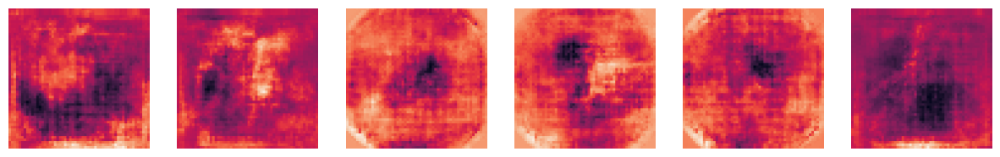

In [ ]:
idx = 0

fig, axis = plt.subplots(1, 6, figsize=(15, 15))
for _images, ax in zip(image_interpretability_3, axis.flat):
  occ = OcclusionMaps(_images)
  heatmap = occ.get_heatmap(ensemble_method, 4, int(labels_interpretability_3[idx]), IMG_SIZE[0])

  ax.imshow(heatmap)
  ax.axis('off')

  idx += 1

<h1>Interpretability of Student</h1>

<h3>LIME</h3>

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

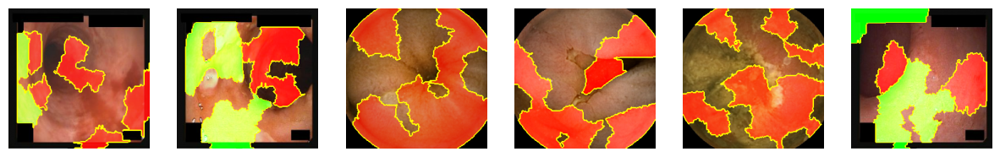

In [ ]:
explainer = lime_image.LimeImageExplainer()

fig, axis = plt.subplots(1, 6, figsize=(15, 15))
for _images, ax in zip(image_interpretability_3, axis.flat):
  img_array = read_and_transform_img(_images)
    
  explanation = explainer.explain_instance(img_array[0].astype(np.uint8), distillation_.predict, hide_color=0, num_samples=1000)
  temp_, mask_ = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=False, num_features=10, hide_rest=False)

  ax.imshow(mark_boundaries(temp_, mask_))
  ax.axis('off')

<h3>RISE (Randomized Image Sampling for Explanations)</h3>

In [ ]:
model_rise = RISE(1000, 8, 0.5, distillation_, batch_size,IMG_SIZE)
masks = model_rise.generate_masks()

Generating masks: 100%|██████████| 1000/1000 [00:02<00:00, 444.15it/s]


Explaining: 100%|██████████| 32/32 [00:02<00:00, 11.15it/s]


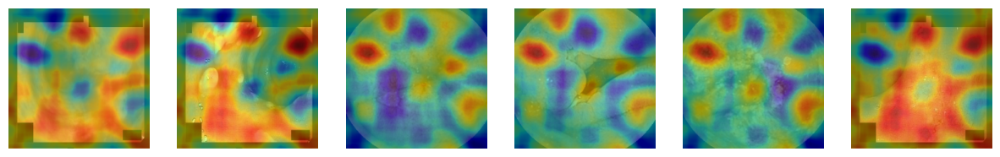

In [ ]:
idx = 0
fig, axis = plt.subplots(1, 6, figsize=(15, 15))
for _images, ax in zip(image_interpretability_3, axis.flat):
  img_array = read_and_transform_img(_images)

  sal = model_rise.explain(img_array, masks)

  ax.imshow(_images.astype(np.uint8))
  ax.imshow(sal[int(labels_interpretability_3[idx])], cmap='jet', alpha=0.5)
  ax.axis('off')

  idx += 1

<h3>Occlusion Sensitivity</h3>

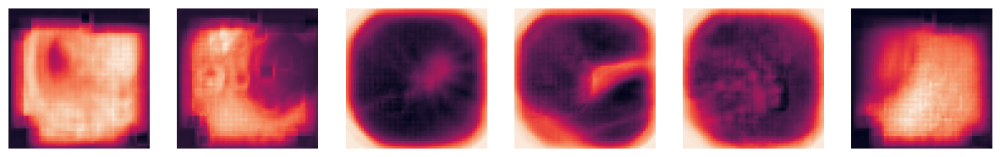

In [ ]:
idx = 0

fig, axis = plt.subplots(1, 6, figsize=(15, 15))
for _images, ax in zip(image_interpretability_3, axis.flat):
  occ = OcclusionMaps(_images)
  heatmap = occ.get_heatmap(distillation_, 4, int(labels_interpretability_3[idx]), IMG_SIZE[0])

  ax.imshow(heatmap)
  ax.axis('off')

  idx += 1

# CNN+LSTM

In [ ]:
inputs = Input(shape=(224, 224, 3))
x = data_augmentation(inputs)
x = layers.Conv2D(filters=32, kernel_size=3, activation='relu', padding = 'same')(x)
x = layers.Conv2D(filters=32, kernel_size=3, activation='relu', padding = 'same')(x)
x = layers.BatchNormalization()(x)
x = layers.MaxPooling2D()(x)
x = layers.Conv2D(filters=64, kernel_size=3, activation='relu', padding = 'same')(x)
x = layers.Conv2D(filters=64, kernel_size=3, activation='relu', padding = 'same')(x)
x = layers.BatchNormalization()(x)
x = layers.MaxPooling2D()(x)
x = layers.Conv2D(filters=128, kernel_size=3, activation='relu', padding = 'same')(x)
x = layers.Conv2D(filters=128, kernel_size=3, activation='relu', padding = 'same')(x)
x = layers.MaxPooling2D()(x)
x = layers.Conv2D(filters=256, kernel_size=3, activation='relu', padding = 'same')(x)
x = layers.Conv2D(filters=256, kernel_size=3, activation='relu', padding = 'same')(x)
x = layers.MaxPooling2D()(x)
x = layers.TimeDistributed(layers.Flatten())(x)
x = layers.Dense(128, activation='relu')(x)
x = layers.Dense(128, activation='relu')(x)
x = layers.Dropout(0.5)(x)
x = layers.Dense(128, activation='relu')(x)
x = layers.LSTM(100, return_sequences=True)(x)
x = layers.LSTM(100, return_sequences=True)(x)
x = layers.LSTM(50)(x)
x = layers.Dense(180, activation='relu')(x)
x = layers.Dense(160, activation='relu')(x)
x = layers.Dropout(0.5)(x)
x = layers.Dense(160, activation='relu')(x)
x = layers.Dropout(0.5)(x)
outputs = layers.Dense(len(class_names), activation='softmax')(x)
hybrid_model = Model(inputs, outputs)

In [ ]:
hybrid_model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 sequential (Sequential)     (None, 224, 224, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 224, 224, 32)      896       
                                                                 
 conv2d_1 (Conv2D)           (None, 224, 224, 32)      9248      
                                                                 
 batch_normalization (BatchN  (None, 224, 224, 32)     128       
 ormalization)                                                   
                                                                 
 max_pooling2d (MaxPooling2D  (None, 112, 112, 32)     0         
 )                                                           

In [ ]:
hybrid_model.compile(loss='sparse_categorical_crossentropy', optimizer=Adam(learning_rate=1e-5), metrics=['accuracy'])

In [ ]:
history_hybrid_model = hybrid_model.fit(train_ds, epochs=200, validation_data=test_ds, callbacks=[early_stopping])

Epoch 1/200
26/26 [==============================] - 18s 309ms/step - loss: 0.6906 - accuracy: 0.4957 - val_loss: 0.6899 - val_accuracy: 0.5092
Epoch 2/200
26/26 [==============================] - 5s 193ms/step - loss: 0.6812 - accuracy: 0.6025 - val_loss: 0.6823 - val_accuracy: 0.5368
Epoch 3/200
26/26 [==============================] - 5s 198ms/step - loss: 0.6692 - accuracy: 0.6294 - val_loss: 0.6696 - val_accuracy: 0.5570
Epoch 4/200
26/26 [==============================] - 5s 193ms/step - loss: 0.6491 - accuracy: 0.7006 - val_loss: 0.6456 - val_accuracy: 0.6765
Epoch 5/200
26/26 [==============================] - 5s 199ms/step - loss: 0.6170 - accuracy: 0.7853 - val_loss: 0.6080 - val_accuracy: 0.7978
Epoch 6/200
26/26 [==============================] - 5s 199ms/step - loss: 0.5807 - accuracy: 0.8748 - val_loss: 0.5723 - val_accuracy: 0.8346
Epoch 7/200
26/26 [==============================] - 5s 195ms/step - loss: 0.5279 - accuracy: 0.9117 - val_loss: 0.5058 - val_accuracy: 0.911

<Axes: >

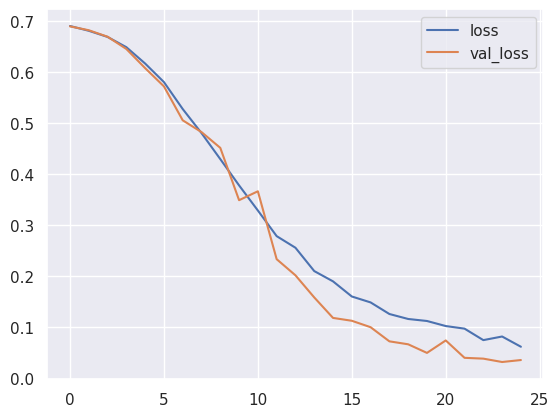

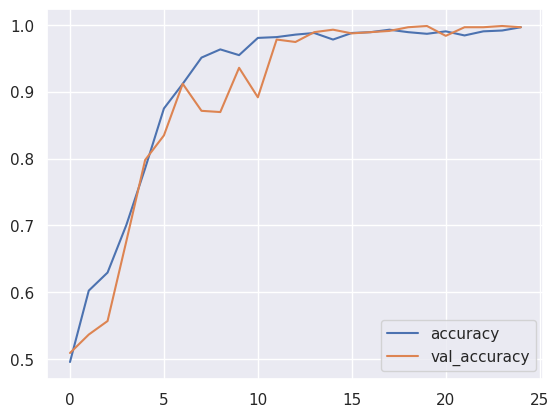

In [ ]:
model_history_hybrid_model = pd.DataFrame(history_hybrid_model.history)
model_history_hybrid_model.loc[:, ['loss', 'val_loss']].plot()
model_history_hybrid_model.loc[:, ['accuracy', 'val_accuracy']].plot()

In [ ]:
print('Accuracy for Train: {:.4f}'.format(model_history_hybrid_model['accuracy'].mean()))
print('Loss for Train: {:.4f}'.format(model_history_hybrid_model['loss'].mean()))
print('Accuracy for Test: {:.4f}'.format(model_history_hybrid_model['val_accuracy'].mean()))
print('Loss for Test: {:.4f}'.format(model_history_hybrid_model['val_loss'].mean()))

Accuracy for Train: 0.9071
Loss for Train: 0.3222
Accuracy for Test: 0.8903
Loss for Test: 0.2946


In [ ]:
start = time.time()
predict_labels_ = hybrid_model.predict(true_images)
duration = time.time() - start

loss_object = SparseCategoricalCrossentropy(from_logits=True)
true_labels_1 = tf.reshape(true_labels, (-1,))
loss = loss_object(true_labels_1,predict_labels_)

predict_labels_hybrid_model = np.argmax(hybrid_model.predict(true_images), axis=1)

print("Accuracy: {:0.4f}".format(accuracy_score(true_labels, predict_labels_hybrid_model)))
print("Loss: {:0.4f}".format(loss))
print("Inference Time: {:.2f}s".format(duration))
print("Precision: {:0.4f}".format(precision_score(true_labels, predict_labels_hybrid_model)))
print("Recall: {:0.4f}".format(recall_score(true_labels, predict_labels_hybrid_model)))
print("F1-Score: {:0.4f}".format(f1_score(true_labels, predict_labels_hybrid_model)))
print("AUC: {:0.4f}".format(roc_auc_score(true_labels, predict_labels_hybrid_model)))
print("MCC: {:0.4f}".format(matthews_corrcoef(true_labels, predict_labels_hybrid_model)))

Accuracy: 0.9926
Loss: 0.3328
Inference Time: 2.23s
Precision: 0.9852
Recall: 1.0000
F1-Score: 0.9925
AUC: 0.9927
MCC: 0.9853


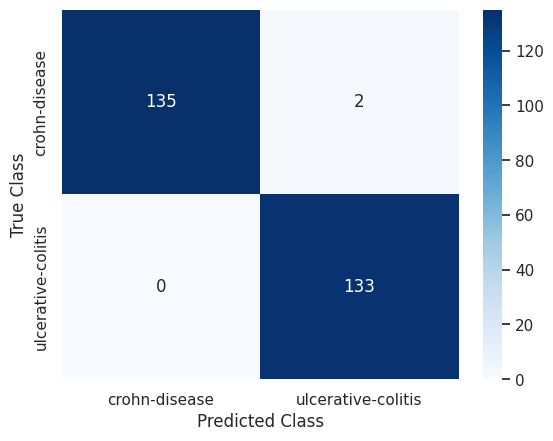

In [ ]:
conf_matrix = pd.DataFrame(confusion_matrix(true_labels, predict_labels_hybrid_model), columns=['crohn-disease', 'ulcerative-colitis'], index=['crohn-disease', 'ulcerative-colitis'])
ax = sns.heatmap(conf_matrix, annot=True, fmt='', cmap='Blues')
ax.set(xlabel='Predicted Class', ylabel='True Class')
plt.show()

In [ ]:
for _images, ax in zip(image_interpretability_3, axis.flat):
  img_array = read_and_transform_img(_images)

  preds = hybrid_model.predict(img_array)
  if np.argmax(preds, axis=1) == 0: print('crohn-disease')
  else: print('ulcerative-colitis')

ulcerative-colitis
crohn-disease
ulcerative-colitis
crohn-disease
ulcerative-colitis
crohn-disease


<h1>Interpretability</h1>

<h3>Grad-Cam</h3>

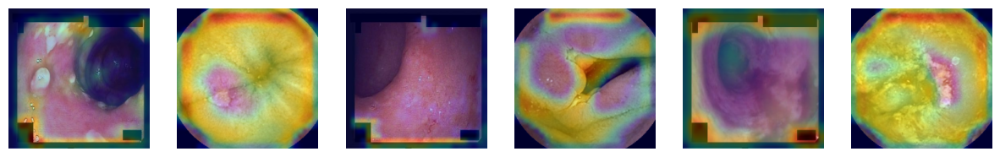

In [ ]:
last_conv_layer_name = "conv2d_7"

fig, axis = plt.subplots(1, 6, figsize=(15, 15))
for _images, ax in zip(image_interpretability_3, axis.flat):
  img_array = read_and_transform_img(_images)

  hybrid_model.layers[-1].activation = None

  preds = hybrid_model.predict(img_array)
  heatmap = make_gradcam_heatmap_CNN(img_array, hybrid_model, last_conv_layer_name)

  heatmap = np.reshape(heatmap, (-1,28))
  display_gradcam(_images, heatmap, preds=preds[0], plot=ax)

<h3>LIME</h3>

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

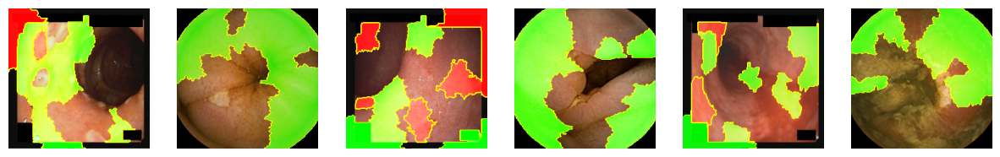

In [ ]:
explainer = lime_image.LimeImageExplainer()

fig, axis = plt.subplots(1, 6, figsize=(15, 15))
for _images, ax in zip(image_interpretability_3, axis.flat):
  img_array = read_and_transform_img(_images)
    
  explanation = explainer.explain_instance(img_array[0].astype(np.uint8), hybrid_model.predict, hide_color=0, num_samples=1000)
  temp_, mask_ = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=False, num_features=10, hide_rest=False)

  ax.imshow(mark_boundaries(temp_, mask_))
  ax.axis('off')

<h3>Shapley Values</h3>

`tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.


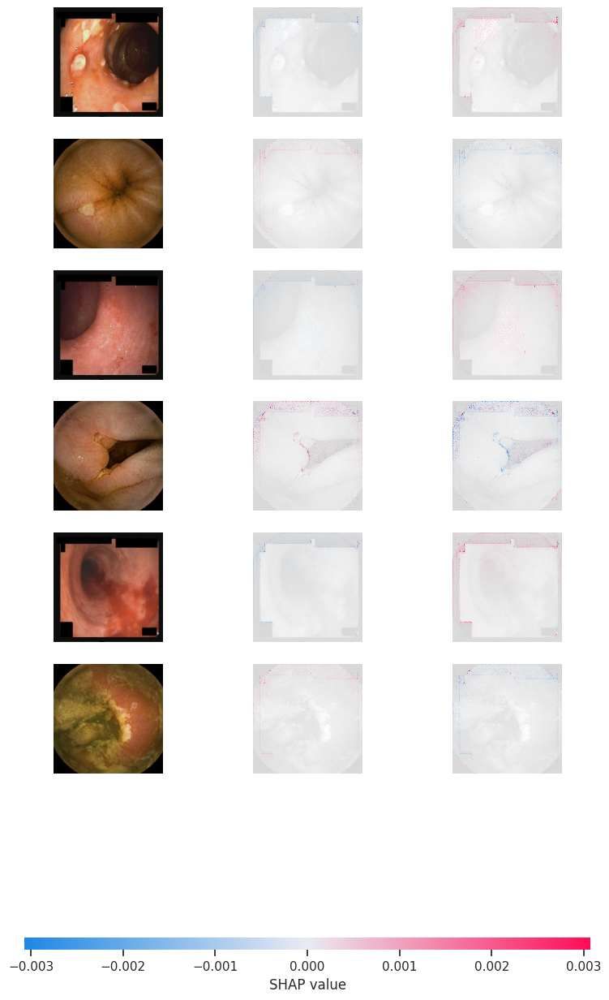

In [ ]:
images_train, labels_train = tuple(zip(*train_ds))
images_train_1 = np.concatenate(images_train)

shap_values = shap.GradientExplainer(hybrid_model, images_train_1).shap_values(image_interpretability_3)
shap.image_plot(shap_values, image_interpretability_3)

<h3>RISE (Randomized Image Sampling for Explanations)</h3>

In [ ]:
model_rise = RISE(1000, 8, 0.5, hybrid_model, batch_size,IMG_SIZE)
masks = model_rise.generate_masks()

Generating masks: 100%|██████████| 1000/1000 [00:02<00:00, 489.72it/s]


Explaining: 100%|██████████| 32/32 [00:02<00:00, 11.56it/s]


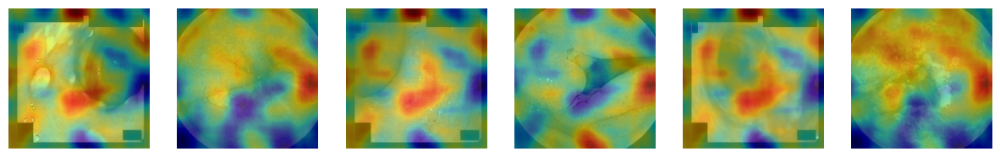

In [ ]:
idx = 0
fig, axis = plt.subplots(1, 6, figsize=(15, 15))
for _images, ax in zip(image_interpretability_3, axis.flat):
  img_array = read_and_transform_img(_images)

  sal = model_rise.explain(img_array, masks)

  ax.imshow(_images.astype(np.uint8))
  ax.imshow(sal[int(labels_interpretability_3[idx])], cmap='jet', alpha=0.5)
  ax.axis('off')

  idx += 1

<h3>Occlusion Sensitivity</h3>

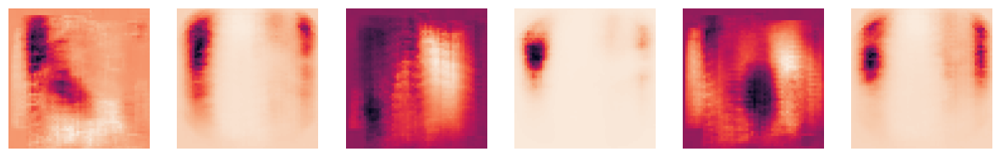

In [ ]:
idx = 0

fig, axis = plt.subplots(1, 6, figsize=(15, 15))
for _images, ax in zip(image_interpretability_3, axis.flat):
  occ = OcclusionMaps(_images)
  heatmap = occ.get_heatmap(hybrid_model, 4, int(labels_interpretability_3[idx]), IMG_SIZE[0])

  ax.imshow(heatmap)
  ax.axis('off')

  idx += 1